In [1]:
import os

CHECKPOINT_PATH = os.path.join("/home/dimakot55/data/extra_models_weights/sam_vit_h_4b8939.pth")
print(CHECKPOINT_PATH, "; exist:", os.path.isfile(CHECKPOINT_PATH))
import torch

DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
MODEL_TYPE = "vit_h"

from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor
from PIL import Image
import supervision as sv
import numpy as np
from matplotlib import pyplot as plt
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)
sam = sam_model_registry[MODEL_TYPE](checkpoint=CHECKPOINT_PATH).to(device=DEVICE)

mask_generator = SamAutomaticMaskGenerator(sam)

/home/dimakot55/data/extra_models_weights/sam_vit_h_4b8939.pth ; exist: True


### Code for 3D visualization



In [2]:

# Functions from @Mateen Ulhaq and @karlo for visualizing 3d points with equal scaling of axes
def set_axes_equal(ax: plt.Axes):
    """Set 3D plot axes to equal scale.

    Make axes of 3D plot have equal scale so that spheres appear as
    spheres and cubes as cubes.  Required since `ax.axis('equal')`
    and `ax.set_aspect('equal')` don't work on 3D.
    """
    limits = np.array([
        ax.get_xlim3d(),
        ax.get_ylim3d(),
        ax.get_zlim3d(),
    ])
    origin = np.mean(limits, axis=1)
    radius = 0.5 * np.max(np.abs(limits[:, 1] - limits[:, 0]))
    _set_axes_radius(ax, origin, radius)

def _set_axes_radius(ax, origin, radius):
    x, y, z = origin
    ax.set_xlim3d([x - radius, x + radius])
    ax.set_ylim3d([y - radius, y + radius])
    ax.set_zlim3d([z - radius, z + radius])


# Initialize content scene

In [3]:
from PIL import Image
import numpy as np 
import os 


import numpy as np
import matplotlib.pyplot as pl
import torch
import ot
import ot.plot

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Enable interactive mode
%matplotlib ipympl
os.environ["CUDA_VISIBLE_DEVICES"] = "1" # has not effect

import sys
sys.path.append("../")
device="cuda"
from tqdm import tqdm_notebook as tqdm

from gaussian_renderer import render, network_gui
from arguments import ModelParams, PipelineParams, OptimizationParams
import argparse
from scene import Scene, GaussianModel
from random import randint
from argparse import ArgumentParser, Namespace

saving_steps = [1, 100, 300, 1_000, 3_000, 7_000, 10_000, 15_000, 20_000, 30_000]
parser = ArgumentParser(description="Training script parameters")
lp = ModelParams(parser)
op = OptimizationParams(parser)
pp = PipelineParams(parser)
parser.add_argument('--ip', type=str, default="127.0.0.1")
parser.add_argument('--port', type=int, default=6009)
parser.add_argument('--debug_from', type=int, default=-1)
parser.add_argument('--detect_anomaly', action='store_true', default=False)
parser.add_argument("--test_iterations", nargs="+", type=int, default=saving_steps)
parser.add_argument("--save_iterations", nargs="+", type=int, default=saving_steps)
parser.add_argument("--quiet", action="store_true")
parser.add_argument("--checkpoint_iterations", nargs="+", type=int, default=saving_steps)# default=[])
parser.add_argument("--start_checkpoint", type=str, default = None)
args = parser.parse_args(("-s /home/dimakot55/data/nerf_synthetic/hotdog/ "+\
                         "--model_path /home/dimakot55/workspace/gaussian-splatting/notebooks/GT_lego_cluster2_test_notebook14/").split())#sys.argv[1:])
#args.save_iterations.append(args.iterations)
dataset=lp.extract(args)
pipe=pp.extract(args)
opt=op.extract(args)
os.makedirs(args.model_path, exist_ok=True)

In [54]:
os.makedirs(args.model_path, exist_ok=True)
content_gaussians = GaussianModel(3)
content_scene = Scene(dataset, content_gaussians, shuffle=False)
content_gaussians.training_setup(opt)

Found transforms_train.json file, assuming Blender data set!
Reading Training Transforms
Reading Test Transforms
Loading Training Cameras
Loading Test Cameras
Number of points at initialisation :  100000


In [86]:
content_scene = Scene(dataset, content_gaussians, shuffle=False)

Found transforms_train.json file, assuming Blender data set!
Reading Training Transforms
Reading Test Transforms
Loading Training Cameras
Loading Test Cameras
Number of points at initialisation :  100000


In [87]:
content_gaussians.restore(torch.load("/home/dimakot55/output_data/gs/GT_hotdog/chkpnt30000.pth")[0], opt)

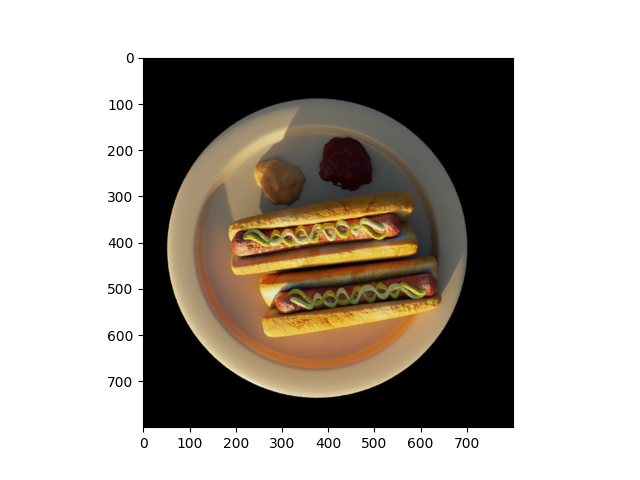

In [93]:

viewpoint_stack = content_scene.getTrainCameras().copy()

viewpoint_cam = viewpoint_stack[13]

bg_color = [1, 1, 1] if dataset.white_background else [0, 0, 0]
background = torch.tensor(bg_color, dtype=torch.float32, device=device)
render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)


image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()

In [89]:
viewpoint_stack[13].full_proj_transform, viewpoint_stack[14].full_proj_transform

(tensor([[ 3.9445e-01,  2.7407e+00, -7.9884e-02, -7.9876e-02],
         [ 2.7496e+00, -3.9316e-01,  1.1460e-02,  1.1459e-02],
         [ 3.0762e-09, -2.2415e-01, -9.9684e-01, -9.9674e-01],
         [-4.5794e-09, -4.2282e-08,  4.0215e+00,  4.0311e+00]], device='cuda:0'),
 tensor([[ 1.8422e+00, -1.5053e+00,  5.1628e-01,  5.1623e-01],
         [-2.0790e+00, -1.3339e+00,  4.5749e-01,  4.5744e-01],
         [-3.8074e-08, -1.9160e+00, -7.2412e-01, -7.2405e-01],
         [-7.2113e-08,  7.2968e-08,  4.0215e+00,  4.0311e+00]], device='cuda:0'))

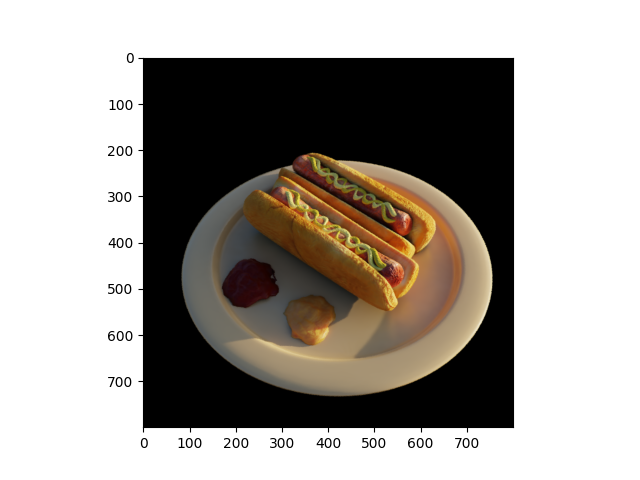

In [94]:

viewpoint_cam = viewpoint_stack[14]

bg_color = [1, 1, 1] if dataset.white_background else [0, 0, 0]
background = torch.tensor(bg_color, dtype=torch.float32, device=device)
render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)


image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()

In [91]:
viewpoint_stack[13].world_view_transform

tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')

In [80]:

from scene.cameras import Camera
viewpoint_cam = Camera(viewpoint_stack.copy()[13])


TypeError: __init__() missing 8 required positional arguments: 'R', 'T', 'FoVx', 'FoVy', 'image', 'gt_alpha_mask', 'image_name', and 'uid'

In [81]:

# alpha = 0.
# viewpoint_cam.world_view_transform = (camera_start_wvt * (1.-alpha) + camera_end_wvt * alpha).clone()
# viewpoint_cam.full_proj_transform = camera_start_fpt * (1.-alpha) + camera_end_fpt * alpha
# viewpoint_cam.camera_center = camera_start_cc * (1.-alpha) + camera_end_cc * alpha

0.0
tensor([[ 3.9445e-01,  2.7407e+00, -7.9884e-02, -7.9876e-02],
        [ 2.7496e+00, -3.9316e-01,  1.1460e-02,  1.1459e-02],
        [ 3.0762e-09, -2.2415e-01, -9.9684e-01, -9.9674e-01],
        [-4.5794e-09, -4.2282e-08,  4.0215e+00,  4.0311e+00]], device='cuda:0')
before: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')
after: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')


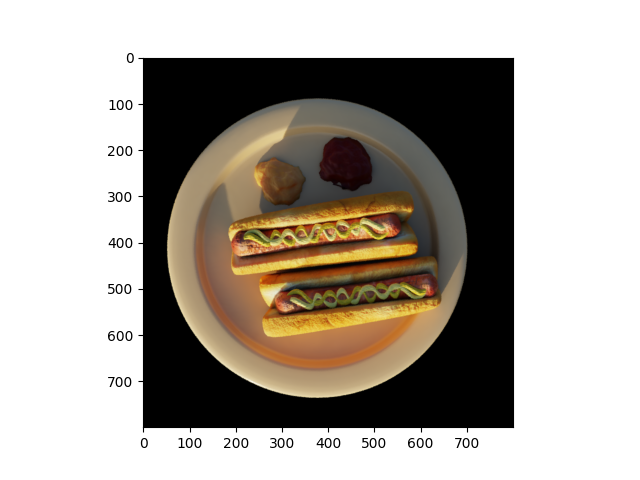

0.1
tensor([[ 5.3923e-01,  2.3161e+00, -2.0267e-02, -2.0265e-02],
        [ 2.2668e+00, -4.8723e-01,  5.6063e-02,  5.6057e-02],
        [-1.0388e-09, -3.9333e-01, -9.6957e-01, -9.6947e-01],
        [-1.1333e-08, -3.0757e-08,  4.0215e+00,  4.0311e+00]], device='cuda:0')
before: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')
after: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')


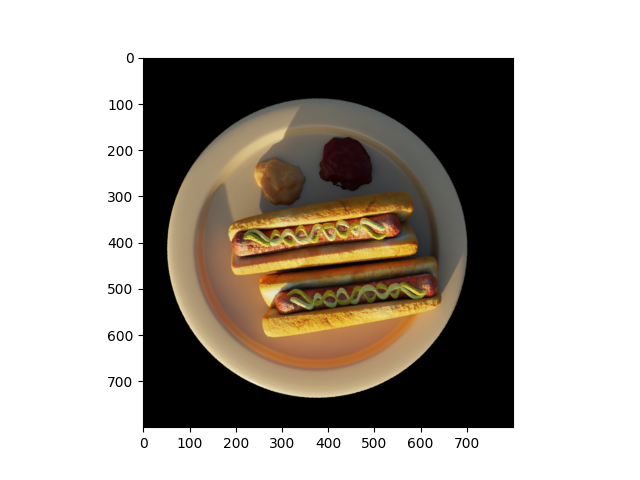

0.2
tensor([[ 6.8401e-01,  1.8915e+00,  3.9349e-02,  3.9345e-02],
        [ 1.7839e+00, -5.8131e-01,  1.0067e-01,  1.0066e-01],
        [-5.1538e-09, -5.6251e-01, -9.4230e-01, -9.4220e-01],
        [-1.8086e-08, -1.9232e-08,  4.0215e+00,  4.0311e+00]], device='cuda:0')
before: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')
after: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')


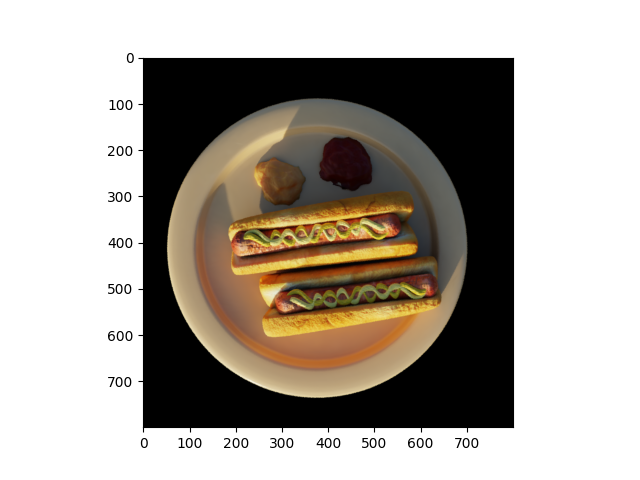

0.30000000000000004
tensor([[ 8.2879e-01,  1.4669e+00,  9.8966e-02,  9.8956e-02],
        [ 1.3010e+00, -6.7538e-01,  1.4527e-01,  1.4525e-01],
        [-9.2687e-09, -7.3169e-01, -9.1502e-01, -9.1493e-01],
        [-2.4840e-08, -7.7069e-09,  4.0215e+00,  4.0311e+00]], device='cuda:0')
before: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')
after: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')


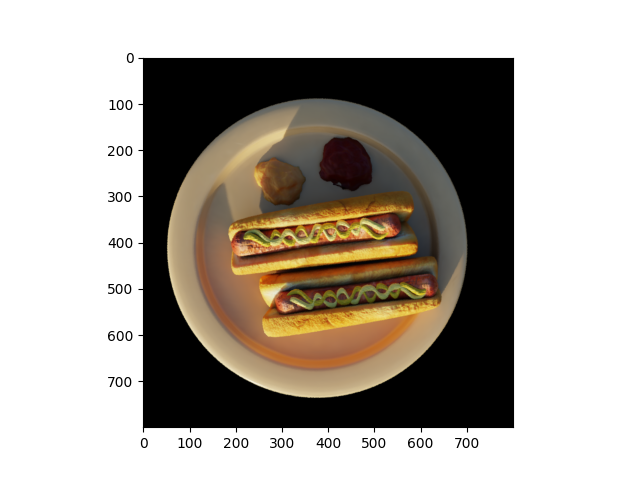

0.4
tensor([[ 9.7356e-01,  1.0423e+00,  1.5858e-01,  1.5857e-01],
        [ 8.1818e-01, -7.6945e-01,  1.8987e-01,  1.8985e-01],
        [-1.3384e-08, -9.0087e-01, -8.8775e-01, -8.8766e-01],
        [-3.1593e-08,  3.8181e-09,  4.0215e+00,  4.0311e+00]], device='cuda:0')
before: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')
after: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')


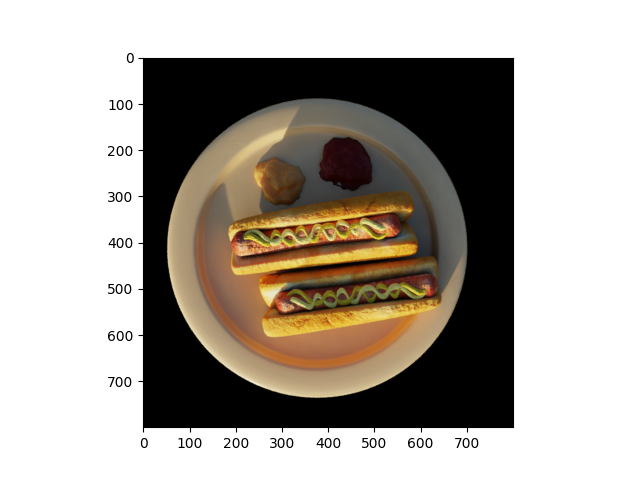

0.5
tensor([[ 1.1183e+00,  6.1768e-01,  2.1820e-01,  2.1818e-01],
        [ 3.3532e-01, -8.6352e-01,  2.3447e-01,  2.3445e-01],
        [-1.7499e-08, -1.0701e+00, -8.6048e-01, -8.6040e-01],
        [-3.8346e-08,  1.5343e-08,  4.0215e+00,  4.0311e+00]], device='cuda:0')
before: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')
after: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')


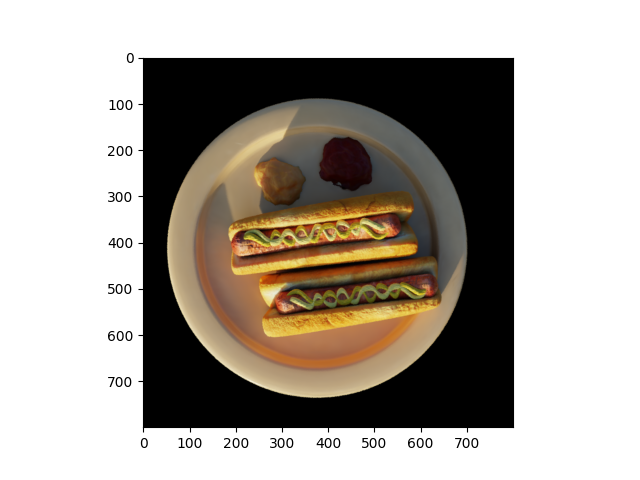

0.6000000000000001
tensor([[ 1.2631e+00,  1.9309e-01,  2.7782e-01,  2.7779e-01],
        [-1.4754e-01, -9.5759e-01,  2.7908e-01,  2.7905e-01],
        [-2.1614e-08, -1.2392e+00, -8.3321e-01, -8.3313e-01],
        [-4.5100e-08,  2.6868e-08,  4.0215e+00,  4.0311e+00]], device='cuda:0')
before: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')
after: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')


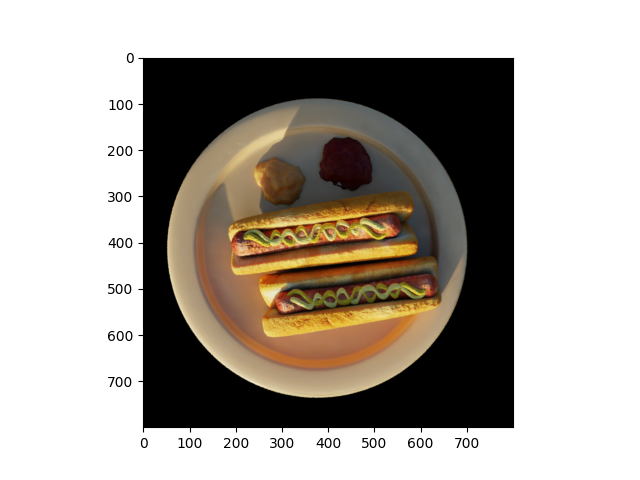

0.7000000000000001
tensor([[ 1.4079e+00, -2.3151e-01,  3.3743e-01,  3.3740e-01],
        [-6.3041e-01, -1.0517e+00,  3.2368e-01,  3.2365e-01],
        [-2.5729e-08, -1.4084e+00, -8.0594e-01, -8.0586e-01],
        [-5.1853e-08,  3.8393e-08,  4.0215e+00,  4.0311e+00]], device='cuda:0')
before: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')
after: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')


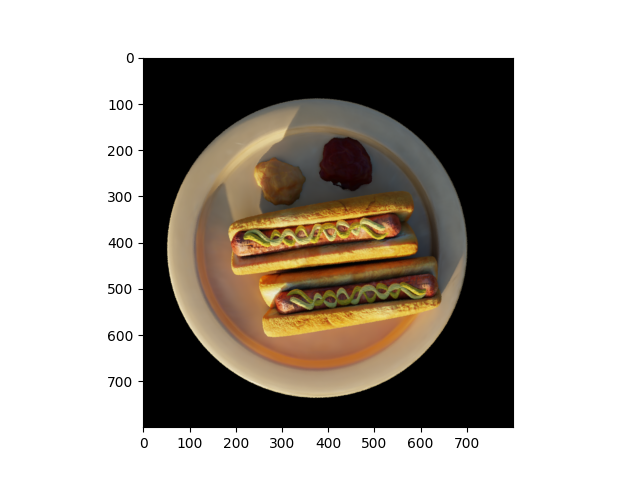

0.8
tensor([[ 1.5527e+00, -6.5611e-01,  3.9705e-01,  3.9701e-01],
        [-1.1133e+00, -1.1457e+00,  3.6828e-01,  3.6825e-01],
        [-2.9844e-08, -1.5776e+00, -7.7867e-01, -7.7859e-01],
        [-5.8606e-08,  4.9918e-08,  4.0215e+00,  4.0311e+00]], device='cuda:0')
before: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')
after: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')


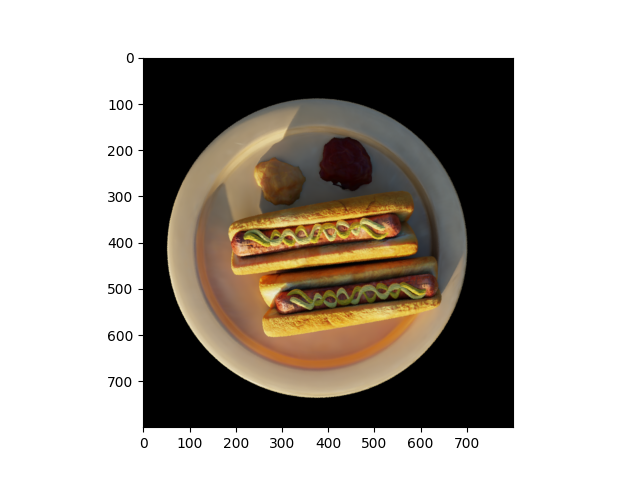

0.9
tensor([[ 1.6975e+00, -1.0807e+00,  4.5667e-01,  4.5662e-01],
        [-1.5961e+00, -1.2398e+00,  4.1289e-01,  4.1284e-01],
        [-3.3959e-08, -1.7468e+00, -7.5140e-01, -7.5132e-01],
        [-6.5360e-08,  6.1443e-08,  4.0215e+00,  4.0311e+00]], device='cuda:0')
before: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')
after: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


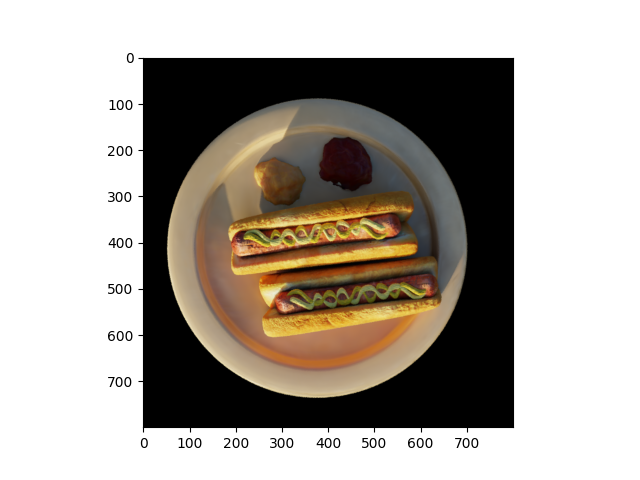

1.0
tensor([[ 1.8422e+00, -1.5053e+00,  5.1628e-01,  5.1623e-01],
        [-2.0790e+00, -1.3339e+00,  4.5749e-01,  4.5744e-01],
        [-3.8074e-08, -1.9160e+00, -7.2412e-01, -7.2405e-01],
        [-7.2113e-08,  7.2968e-08,  4.0215e+00,  4.0311e+00]], device='cuda:0')
before: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')
after: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')


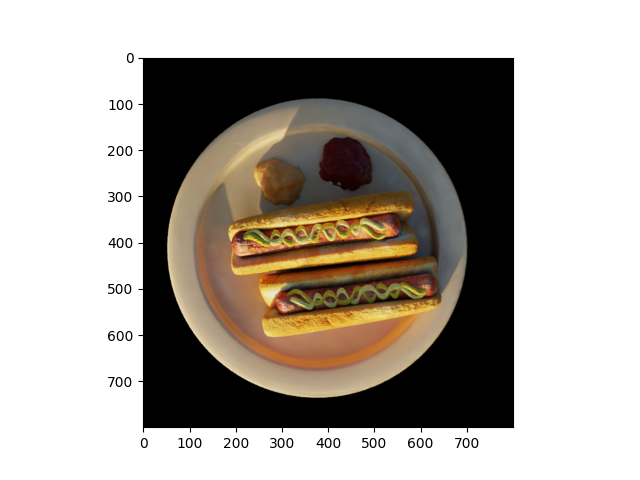

In [108]:

camera_start_wvt = viewpoint_stack[13].world_view_transform.detach().clone()
camera_start_fpt = viewpoint_stack[13].full_proj_transform.detach().clone()
camera_start_cc = viewpoint_stack[13].camera_center.detach().clone()

camera_end_wvt = viewpoint_stack[14].world_view_transform.detach().clone()
camera_end_fpt = viewpoint_stack[14].full_proj_transform.detach().clone()
camera_end_cc = viewpoint_stack[14].camera_center.detach().clone()

viewpoint_cam = viewpoint_stack.copy()[13]

for alpha in np.arange(0,1.01,0.1):
    print(alpha)
    print(matrix_start * (1.-alpha) + matrix_end * alpha)

    print("before:", viewpoint_cam.world_view_transform)
    viewpoint_cam.world_view_transform = (camera_start_wvt * (1.-alpha) + camera_end_wvt * alpha).clone()
    viewpoint_cam.full_proj_transform = (camera_start_fpt * (1.-alpha) + camera_end_fpt * alpha).clone()
    #viewpoint_cam.camera_center = (camera_start_cc * (1.-alpha) + camera_end_cc * alpha).clone()
    print("after:", viewpoint_cam.world_view_transform)
    
    bg_color = [1, 1, 1] if dataset.white_background else [0, 0, 0]
    background = torch.tensor(bg_color, dtype=torch.float32, device=device)
    render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
    image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]
    image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
    plt.figure()
    plt.imshow(image_rgb)
    plt.show()




alpha = 0.
viewpoint_cam.world_view_transform = (camera_start_wvt * (1.-alpha) + camera_end_wvt * alpha).clone()
viewpoint_cam.full_proj_transform = (camera_start_fpt * (1.-alpha) + camera_end_fpt * alpha).clone()
viewpoint_cam.camera_center = (camera_start_cc * (1.-alpha) + camera_end_cc * alpha).clone()

0.0
tensor([[ 3.9445e-01,  2.7407e+00, -7.9884e-02, -7.9876e-02],
        [ 2.7496e+00, -3.9316e-01,  1.1460e-02,  1.1459e-02],
        [ 3.0762e-09, -2.2415e-01, -9.9684e-01, -9.9674e-01],
        [-4.5794e-09, -4.2282e-08,  4.0215e+00,  4.0311e+00]], device='cuda:0')
before: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')
after: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')


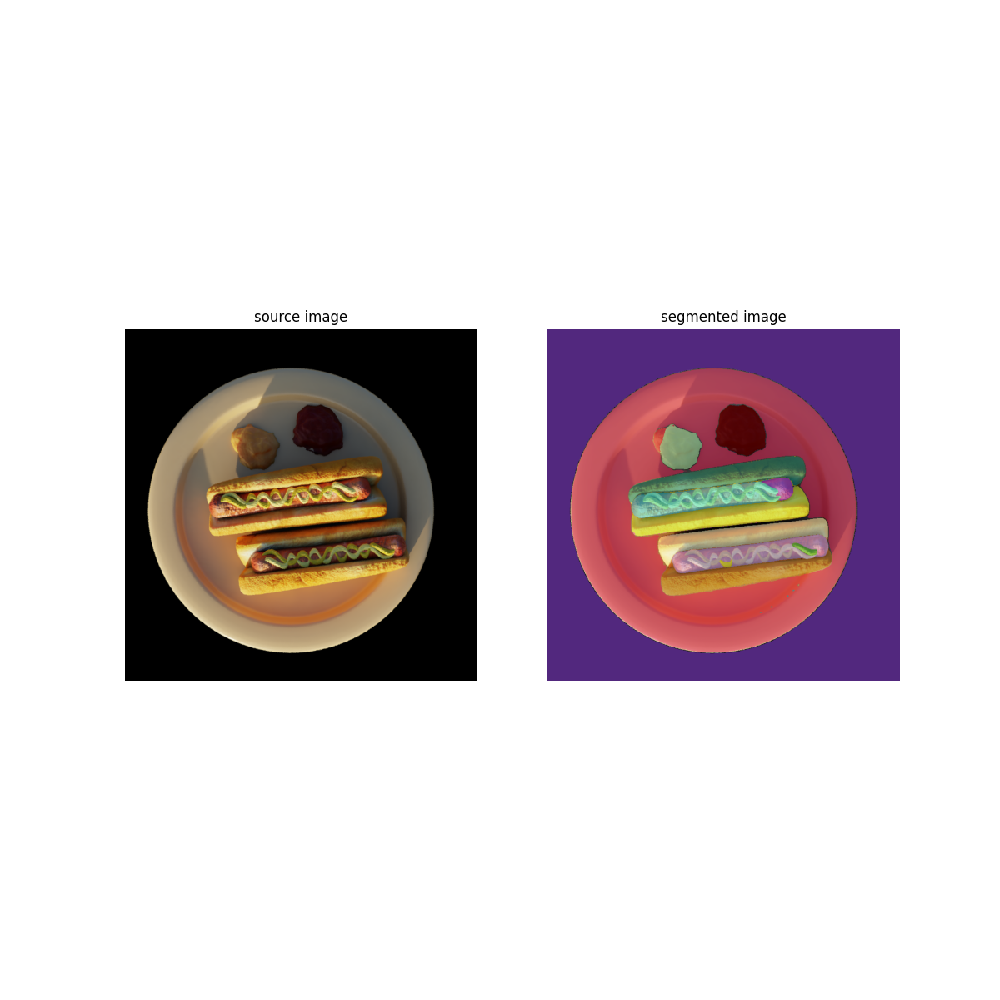

0.1
tensor([[ 5.3923e-01,  2.3161e+00, -2.0267e-02, -2.0265e-02],
        [ 2.2668e+00, -4.8723e-01,  5.6063e-02,  5.6057e-02],
        [-1.0388e-09, -3.9333e-01, -9.6957e-01, -9.6947e-01],
        [-1.1333e-08, -3.0757e-08,  4.0215e+00,  4.0311e+00]], device='cuda:0')
before: tensor([[ 1.4200e-01,  9.8664e-01, -7.9876e-02,  0.0000e+00],
        [ 9.8987e-01, -1.4154e-01,  1.1459e-02,  0.0000e+00],
        [ 1.1074e-09, -8.0694e-02, -9.9674e-01,  0.0000e+00],
        [-1.6486e-09, -1.5221e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')
after: tensor([[ 1.9412e-01,  8.3378e-01, -2.0265e-02,  0.0000e+00],
        [ 8.1604e-01, -1.7540e-01,  5.6057e-02,  0.0000e+00],
        [-3.7396e-10, -1.4160e-01, -9.6947e-01,  0.0000e+00],
        [-4.0798e-09, -1.1072e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')


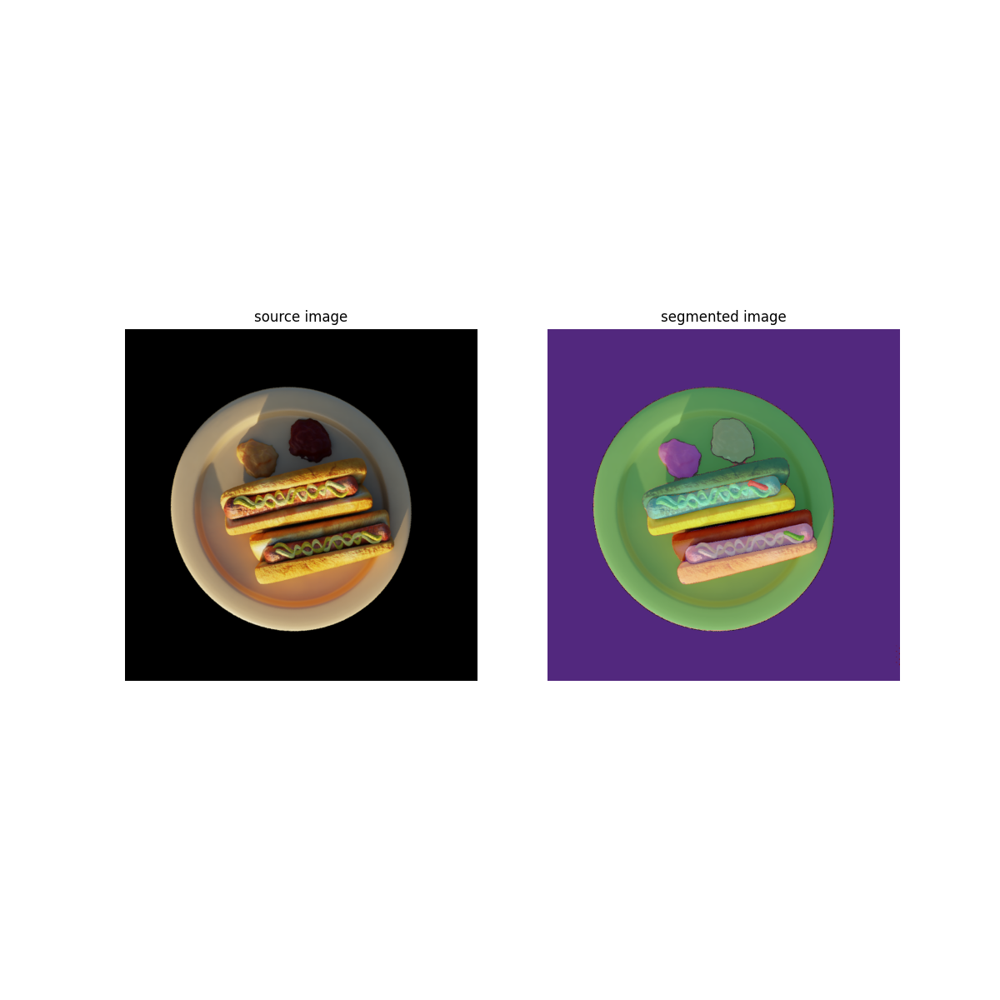

0.2
tensor([[ 6.8401e-01,  1.8915e+00,  3.9349e-02,  3.9345e-02],
        [ 1.7839e+00, -5.8131e-01,  1.0067e-01,  1.0066e-01],
        [-5.1538e-09, -5.6251e-01, -9.4230e-01, -9.4220e-01],
        [-1.8086e-08, -1.9232e-08,  4.0215e+00,  4.0311e+00]], device='cuda:0')
before: tensor([[ 1.9412e-01,  8.3378e-01, -2.0265e-02,  0.0000e+00],
        [ 8.1604e-01, -1.7540e-01,  5.6057e-02,  0.0000e+00],
        [-3.7396e-10, -1.4160e-01, -9.6947e-01,  0.0000e+00],
        [-4.0798e-09, -1.1072e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')
after: tensor([[ 2.4624e-01,  6.8093e-01,  3.9345e-02,  0.0000e+00],
        [ 6.4221e-01, -2.0927e-01,  1.0066e-01,  0.0000e+00],
        [-1.8554e-09, -2.0250e-01, -9.4220e-01,  0.0000e+00],
        [-6.5110e-09, -6.9235e-09,  4.0311e+00,  1.0000e+00]], device='cuda:0')


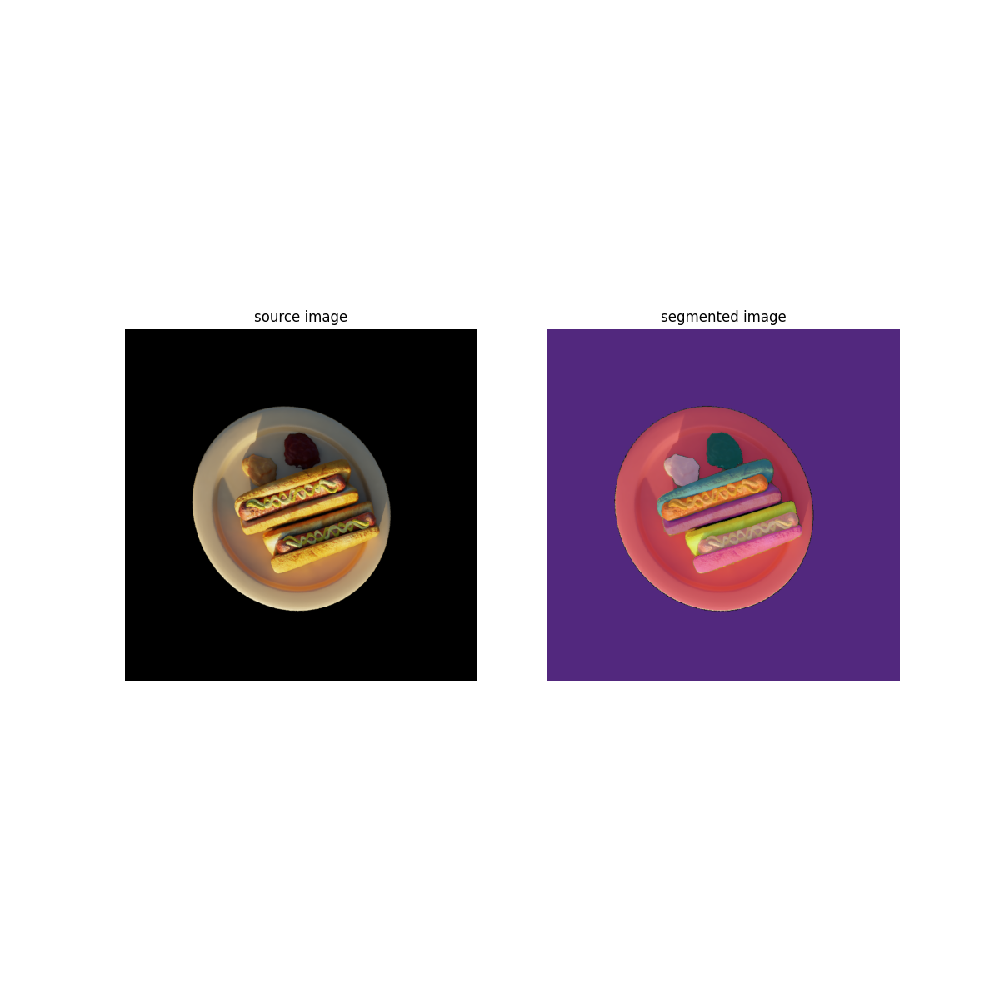

0.30000000000000004
tensor([[ 8.2879e-01,  1.4669e+00,  9.8966e-02,  9.8956e-02],
        [ 1.3010e+00, -6.7538e-01,  1.4527e-01,  1.4525e-01],
        [-9.2687e-09, -7.3169e-01, -9.1502e-01, -9.1493e-01],
        [-2.4840e-08, -7.7069e-09,  4.0215e+00,  4.0311e+00]], device='cuda:0')
before: tensor([[ 2.4624e-01,  6.8093e-01,  3.9345e-02,  0.0000e+00],
        [ 6.4221e-01, -2.0927e-01,  1.0066e-01,  0.0000e+00],
        [-1.8554e-09, -2.0250e-01, -9.4220e-01,  0.0000e+00],
        [-6.5110e-09, -6.9235e-09,  4.0311e+00,  1.0000e+00]], device='cuda:0')
after: tensor([[ 2.9836e-01,  5.2807e-01,  9.8956e-02,  0.0000e+00],
        [ 4.6838e-01, -2.4314e-01,  1.4525e-01,  0.0000e+00],
        [-3.3367e-09, -2.6341e-01, -9.1493e-01,  0.0000e+00],
        [-8.9422e-09, -2.7745e-09,  4.0311e+00,  1.0000e+00]], device='cuda:0')


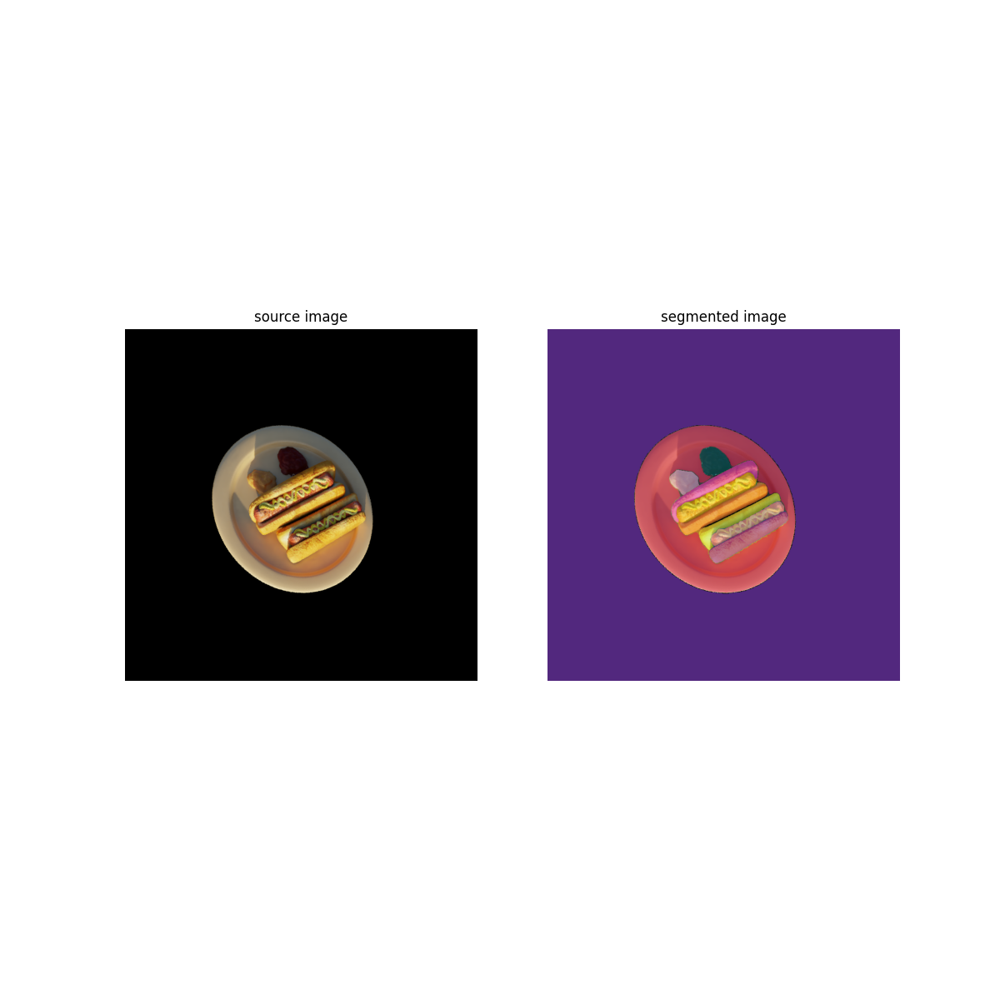

0.4
tensor([[ 9.7356e-01,  1.0423e+00,  1.5858e-01,  1.5857e-01],
        [ 8.1818e-01, -7.6945e-01,  1.8987e-01,  1.8985e-01],
        [-1.3384e-08, -9.0087e-01, -8.8775e-01, -8.8766e-01],
        [-3.1593e-08,  3.8181e-09,  4.0215e+00,  4.0311e+00]], device='cuda:0')
before: tensor([[ 2.9836e-01,  5.2807e-01,  9.8956e-02,  0.0000e+00],
        [ 4.6838e-01, -2.4314e-01,  1.4525e-01,  0.0000e+00],
        [-3.3367e-09, -2.6341e-01, -9.1493e-01,  0.0000e+00],
        [-8.9422e-09, -2.7745e-09,  4.0311e+00,  1.0000e+00]], device='cuda:0')
after: tensor([[ 3.5048e-01,  3.7522e-01,  1.5857e-01,  0.0000e+00],
        [ 2.9454e-01, -2.7700e-01,  1.8985e-01,  0.0000e+00],
        [-4.8181e-09, -3.2431e-01, -8.8766e-01,  0.0000e+00],
        [-1.1373e-08,  1.3745e-09,  4.0311e+00,  1.0000e+00]], device='cuda:0')


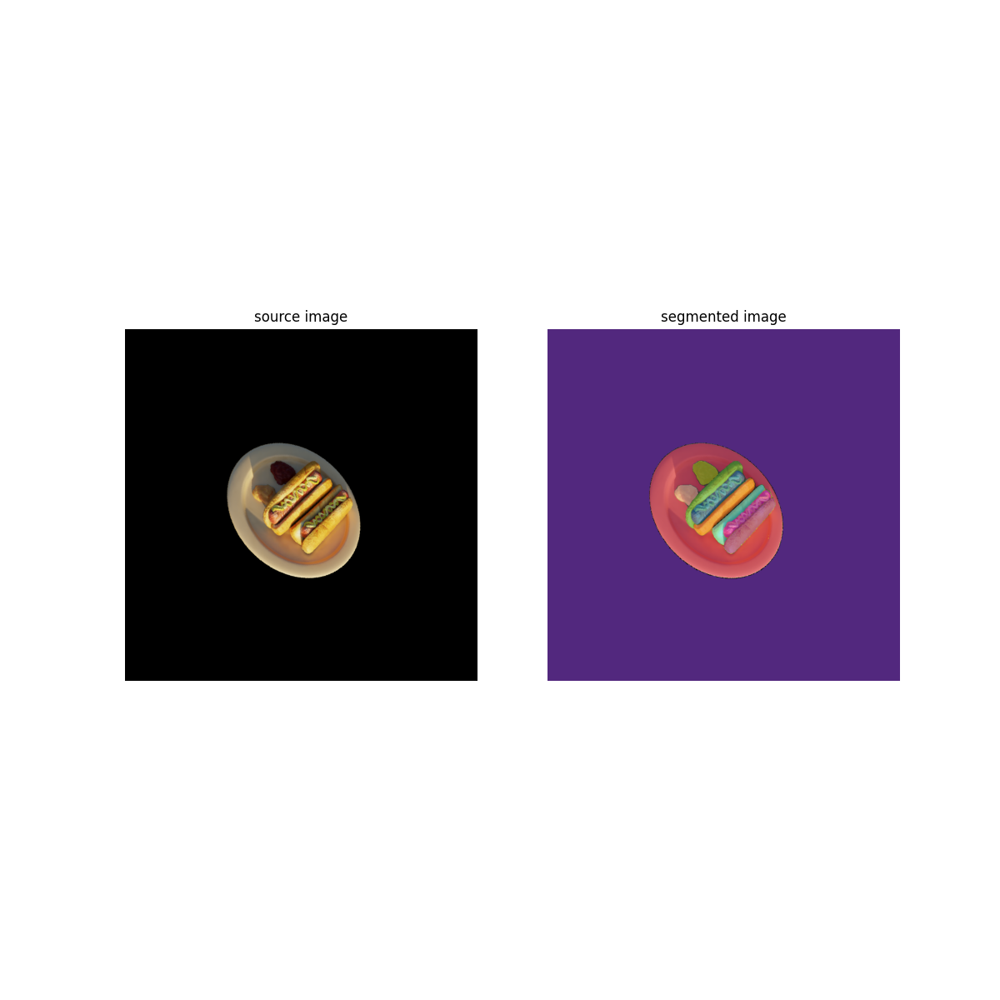

0.5
tensor([[ 1.1183e+00,  6.1768e-01,  2.1820e-01,  2.1818e-01],
        [ 3.3532e-01, -8.6352e-01,  2.3447e-01,  2.3445e-01],
        [-1.7499e-08, -1.0701e+00, -8.6048e-01, -8.6040e-01],
        [-3.8346e-08,  1.5343e-08,  4.0215e+00,  4.0311e+00]], device='cuda:0')
before: tensor([[ 3.5048e-01,  3.7522e-01,  1.5857e-01,  0.0000e+00],
        [ 2.9454e-01, -2.7700e-01,  1.8985e-01,  0.0000e+00],
        [-4.8181e-09, -3.2431e-01, -8.8766e-01,  0.0000e+00],
        [-1.1373e-08,  1.3745e-09,  4.0311e+00,  1.0000e+00]], device='cuda:0')
after: tensor([[ 4.0260e-01,  2.2237e-01,  2.1818e-01,  0.0000e+00],
        [ 1.2071e-01, -3.1087e-01,  2.3445e-01,  0.0000e+00],
        [-6.2995e-09, -3.8522e-01, -8.6040e-01,  0.0000e+00],
        [-1.3805e-08,  5.5235e-09,  4.0311e+00,  1.0000e+00]], device='cuda:0')


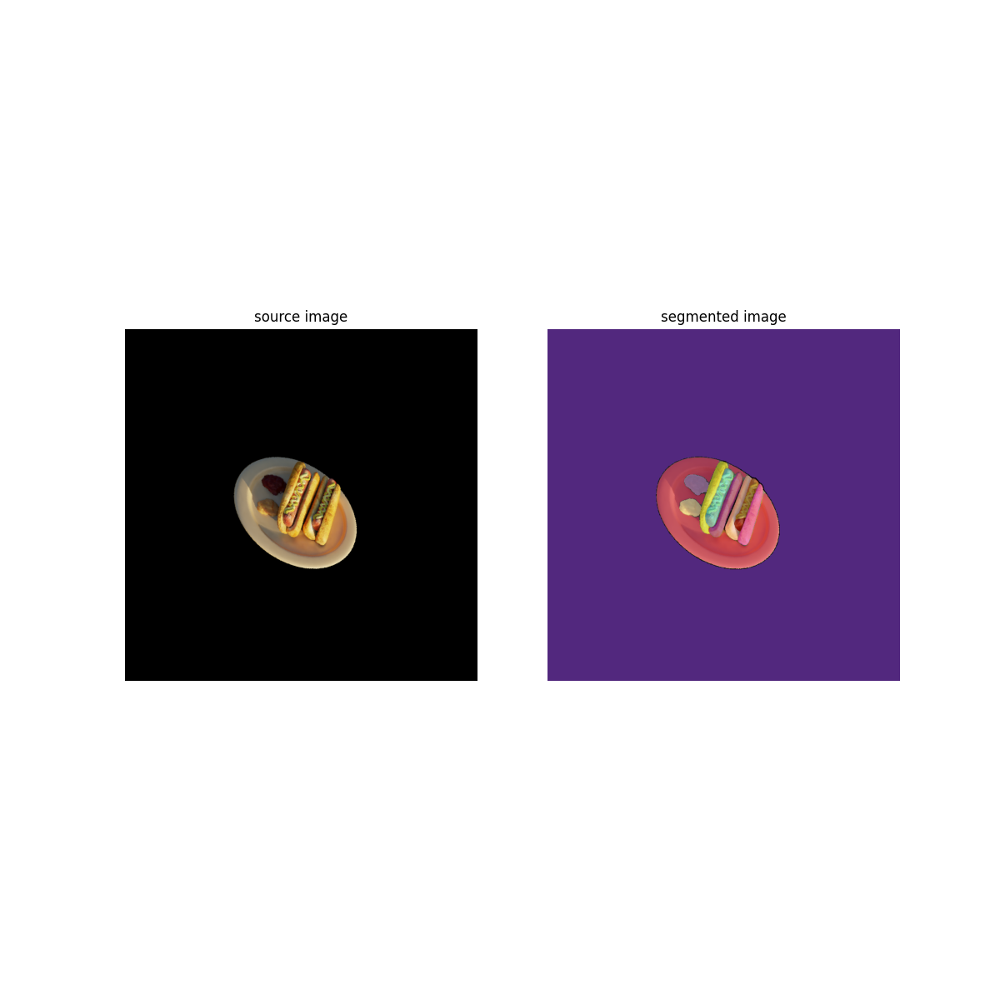

0.6000000000000001
tensor([[ 1.2631e+00,  1.9309e-01,  2.7782e-01,  2.7779e-01],
        [-1.4754e-01, -9.5759e-01,  2.7908e-01,  2.7905e-01],
        [-2.1614e-08, -1.2392e+00, -8.3321e-01, -8.3313e-01],
        [-4.5100e-08,  2.6868e-08,  4.0215e+00,  4.0311e+00]], device='cuda:0')
before: tensor([[ 4.0260e-01,  2.2237e-01,  2.1818e-01,  0.0000e+00],
        [ 1.2071e-01, -3.1087e-01,  2.3445e-01,  0.0000e+00],
        [-6.2995e-09, -3.8522e-01, -8.6040e-01,  0.0000e+00],
        [-1.3805e-08,  5.5235e-09,  4.0311e+00,  1.0000e+00]], device='cuda:0')
after: tensor([[ 4.5472e-01,  6.9511e-02,  2.7779e-01,  0.0000e+00],
        [-5.3116e-02, -3.4473e-01,  2.7905e-01,  0.0000e+00],
        [-7.7809e-09, -4.4612e-01, -8.3313e-01,  0.0000e+00],
        [-1.6236e-08,  9.6725e-09,  4.0311e+00,  1.0000e+00]], device='cuda:0')


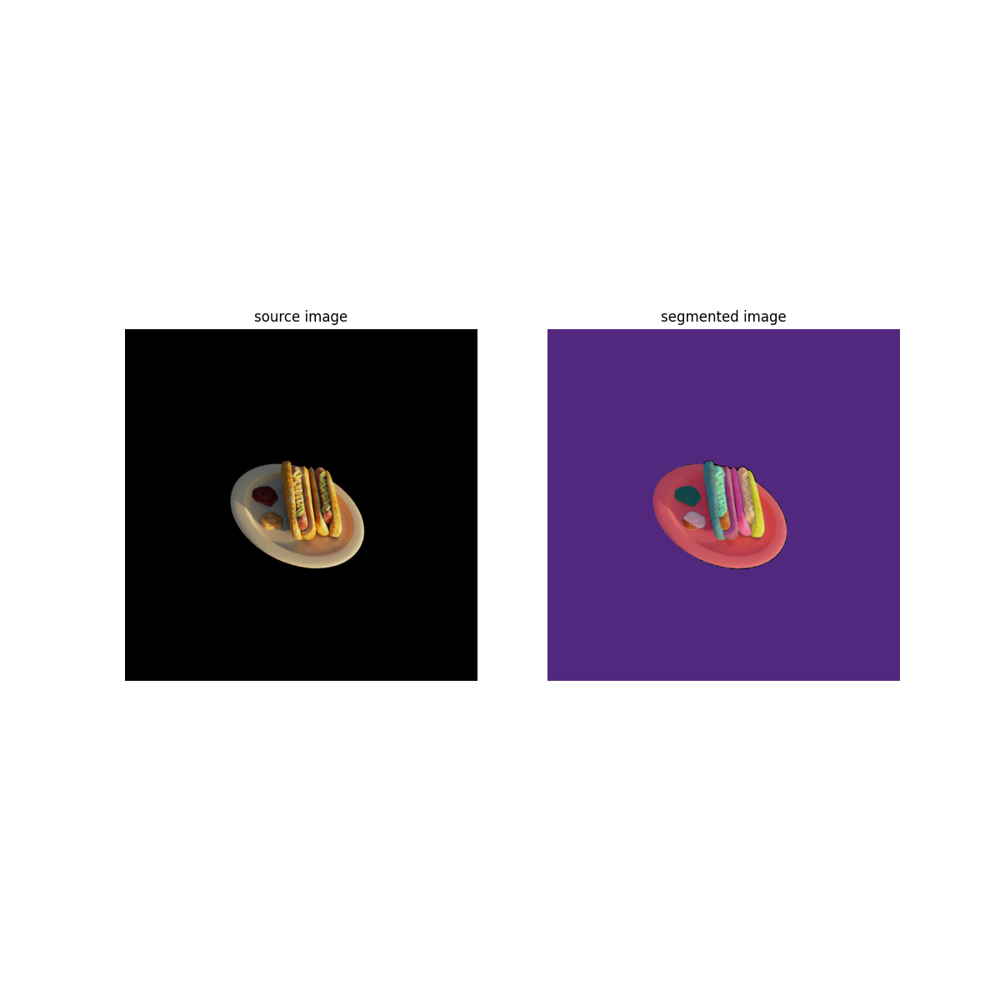

0.7000000000000001
tensor([[ 1.4079e+00, -2.3151e-01,  3.3743e-01,  3.3740e-01],
        [-6.3041e-01, -1.0517e+00,  3.2368e-01,  3.2365e-01],
        [-2.5729e-08, -1.4084e+00, -8.0594e-01, -8.0586e-01],
        [-5.1853e-08,  3.8393e-08,  4.0215e+00,  4.0311e+00]], device='cuda:0')
before: tensor([[ 4.5472e-01,  6.9511e-02,  2.7779e-01,  0.0000e+00],
        [-5.3116e-02, -3.4473e-01,  2.7905e-01,  0.0000e+00],
        [-7.7809e-09, -4.4612e-01, -8.3313e-01,  0.0000e+00],
        [-1.6236e-08,  9.6725e-09,  4.0311e+00,  1.0000e+00]], device='cuda:0')
after: tensor([[ 5.0684e-01, -8.3344e-02,  3.3740e-01,  0.0000e+00],
        [-2.2695e-01, -3.7860e-01,  3.2365e-01,  0.0000e+00],
        [-9.2623e-09, -5.0703e-01, -8.0586e-01,  0.0000e+00],
        [-1.8667e-08,  1.3822e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')


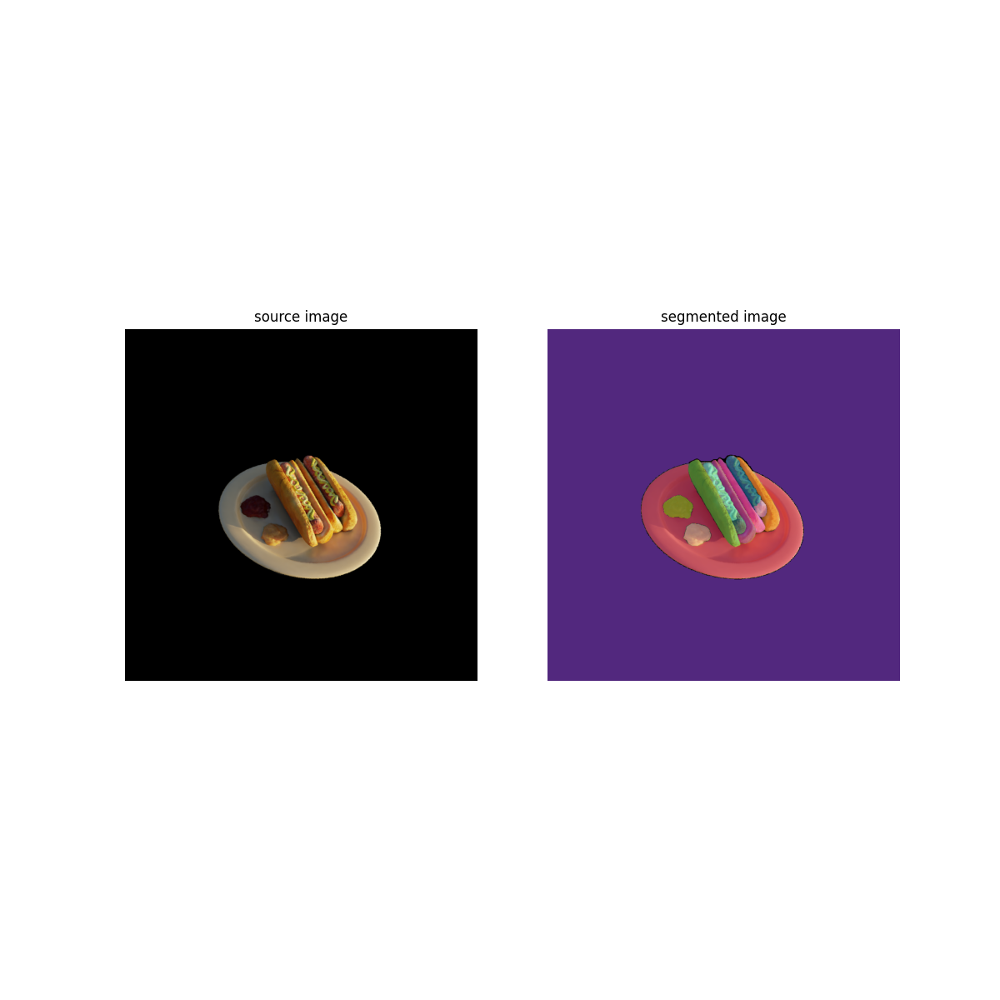

0.8
tensor([[ 1.5527e+00, -6.5611e-01,  3.9705e-01,  3.9701e-01],
        [-1.1133e+00, -1.1457e+00,  3.6828e-01,  3.6825e-01],
        [-2.9844e-08, -1.5776e+00, -7.7867e-01, -7.7859e-01],
        [-5.8606e-08,  4.9918e-08,  4.0215e+00,  4.0311e+00]], device='cuda:0')
before: tensor([[ 5.0684e-01, -8.3344e-02,  3.3740e-01,  0.0000e+00],
        [-2.2695e-01, -3.7860e-01,  3.2365e-01,  0.0000e+00],
        [-9.2623e-09, -5.0703e-01, -8.0586e-01,  0.0000e+00],
        [-1.8667e-08,  1.3822e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')
after: tensor([[ 5.5896e-01, -2.3620e-01,  3.9701e-01,  0.0000e+00],
        [-4.0078e-01, -4.1246e-01,  3.6825e-01,  0.0000e+00],
        [-1.0744e-08, -5.6794e-01, -7.7859e-01,  0.0000e+00],
        [-2.1098e-08,  1.7971e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')


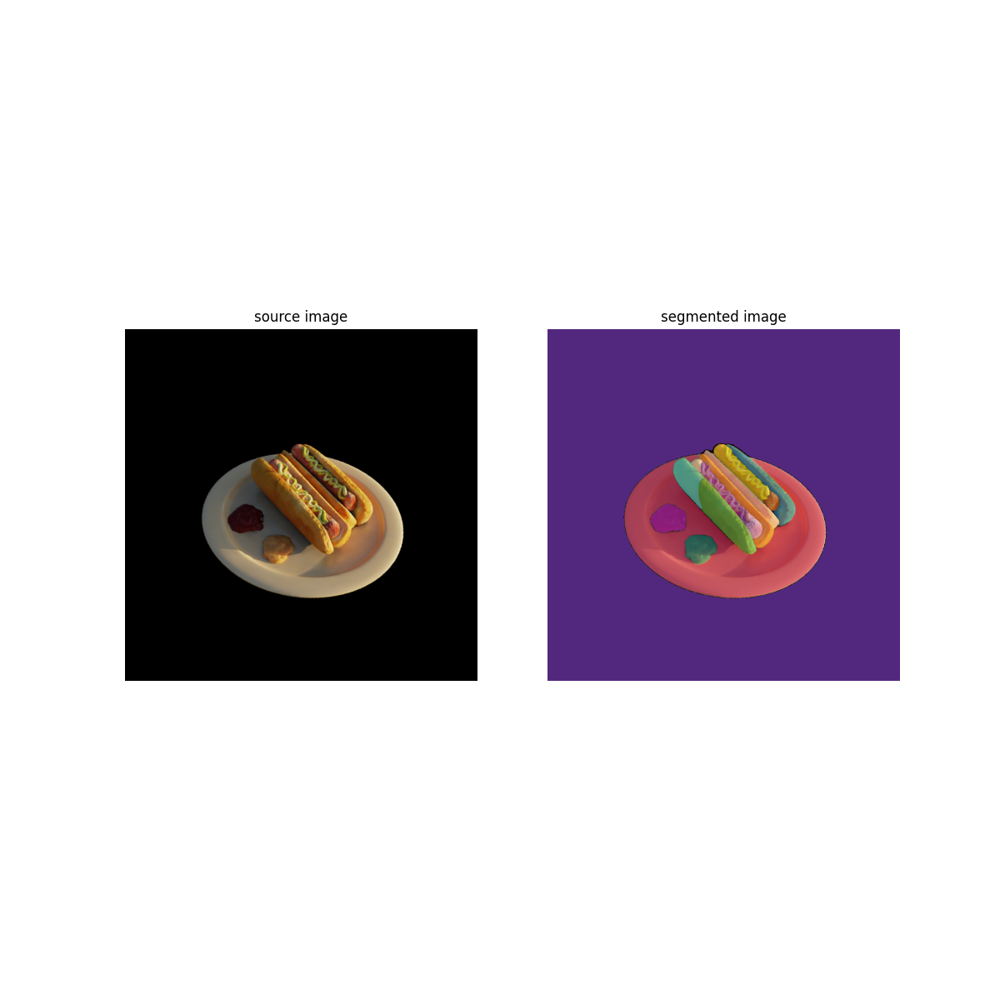

0.9
tensor([[ 1.6975e+00, -1.0807e+00,  4.5667e-01,  4.5662e-01],
        [-1.5961e+00, -1.2398e+00,  4.1289e-01,  4.1284e-01],
        [-3.3959e-08, -1.7468e+00, -7.5140e-01, -7.5132e-01],
        [-6.5360e-08,  6.1443e-08,  4.0215e+00,  4.0311e+00]], device='cuda:0')
before: tensor([[ 5.5896e-01, -2.3620e-01,  3.9701e-01,  0.0000e+00],
        [-4.0078e-01, -4.1246e-01,  3.6825e-01,  0.0000e+00],
        [-1.0744e-08, -5.6794e-01, -7.7859e-01,  0.0000e+00],
        [-2.1098e-08,  1.7971e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')
after: tensor([[ 6.1108e-01, -3.8905e-01,  4.5662e-01,  0.0000e+00],
        [-5.7461e-01, -4.4633e-01,  4.1284e-01,  0.0000e+00],
        [-1.2225e-08, -6.2884e-01, -7.5132e-01,  0.0000e+00],
        [-2.3530e-08,  2.2120e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')


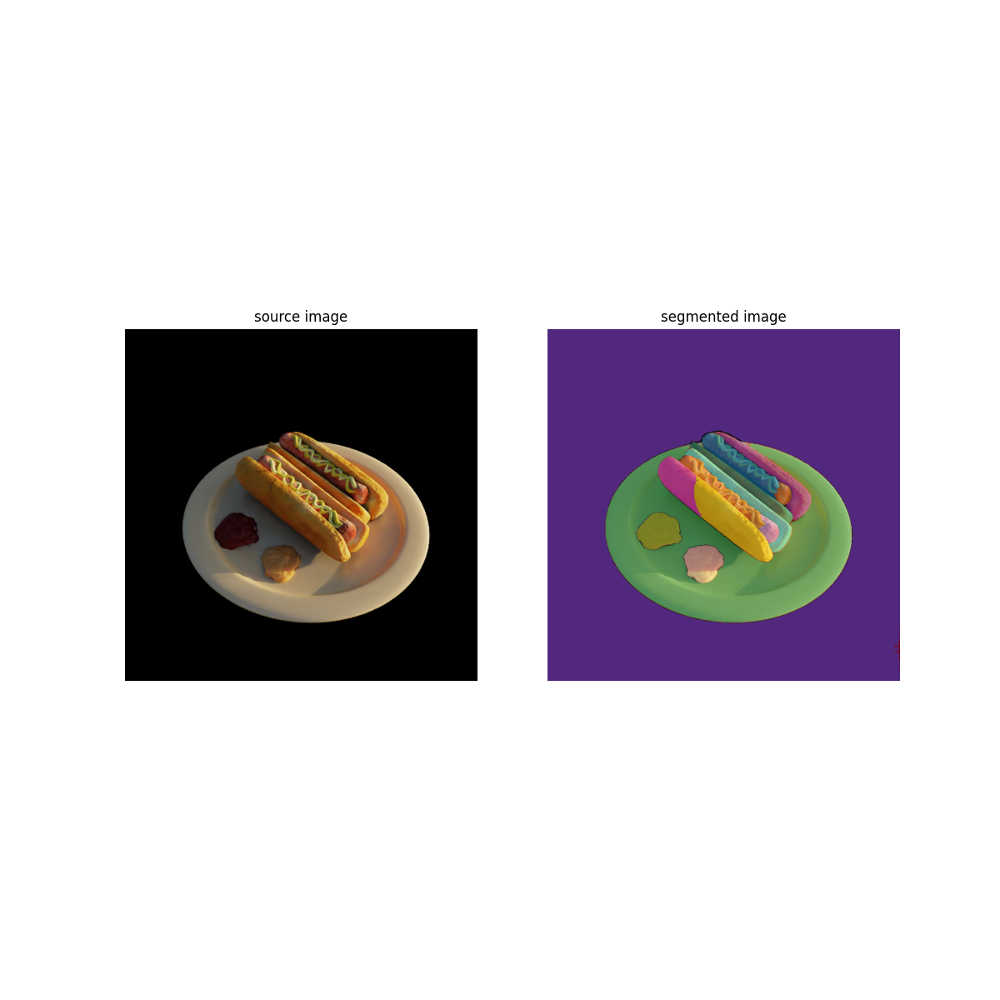

1.0
tensor([[ 1.8422e+00, -1.5053e+00,  5.1628e-01,  5.1623e-01],
        [-2.0790e+00, -1.3339e+00,  4.5749e-01,  4.5744e-01],
        [-3.8074e-08, -1.9160e+00, -7.2412e-01, -7.2405e-01],
        [-7.2113e-08,  7.2968e-08,  4.0215e+00,  4.0311e+00]], device='cuda:0')
before: tensor([[ 6.1108e-01, -3.8905e-01,  4.5662e-01,  0.0000e+00],
        [-5.7461e-01, -4.4633e-01,  4.1284e-01,  0.0000e+00],
        [-1.2225e-08, -6.2884e-01, -7.5132e-01,  0.0000e+00],
        [-2.3530e-08,  2.2120e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')
after: tensor([[ 6.6321e-01, -5.4191e-01,  5.1623e-01,  0.0000e+00],
        [-7.4844e-01, -4.8019e-01,  4.5744e-01,  0.0000e+00],
        [-1.3707e-08, -6.8975e-01, -7.2405e-01,  0.0000e+00],
        [-2.5961e-08,  2.6269e-08,  4.0311e+00,  1.0000e+00]], device='cuda:0')


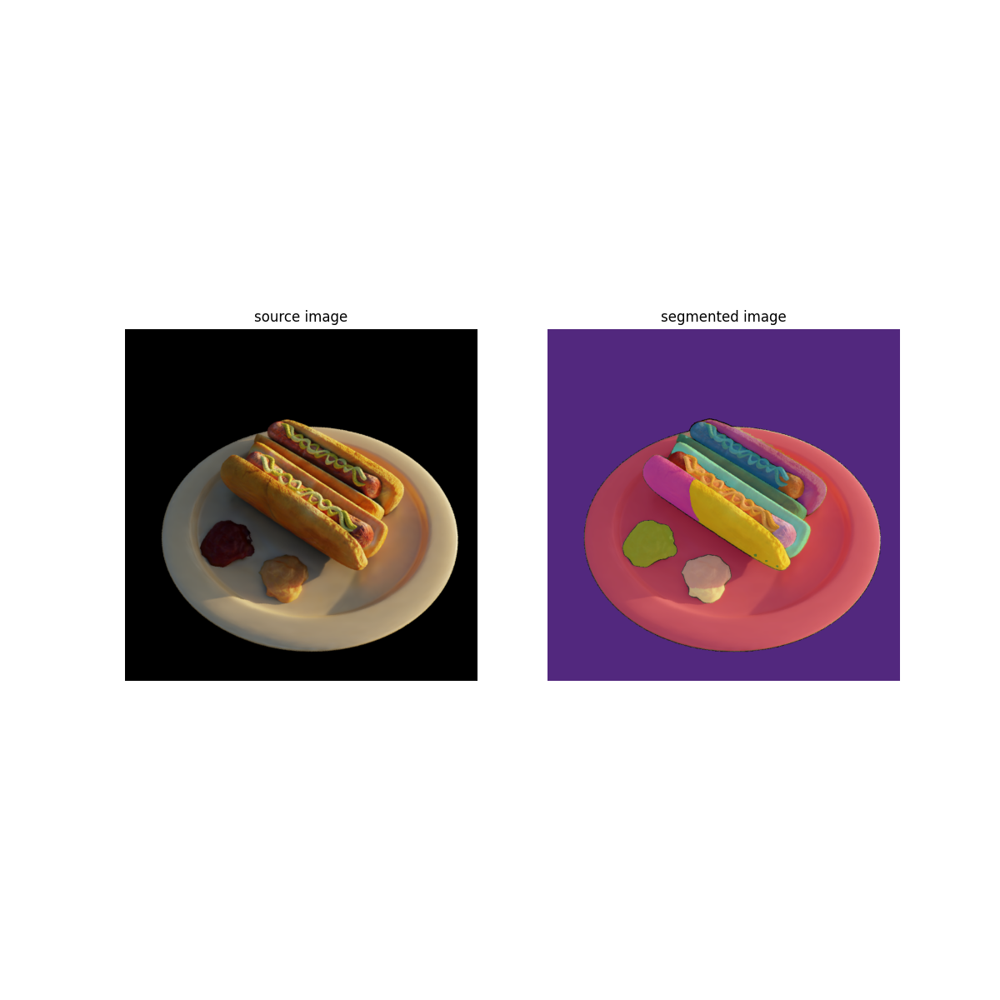

In [107]:

camera_start_wvt = viewpoint_stack[13].world_view_transform.detach().clone()
camera_start_fpt = viewpoint_stack[13].full_proj_transform.detach().clone()
camera_start_cc = viewpoint_stack[13].camera_center.detach().clone()

camera_end_wvt = viewpoint_stack[14].world_view_transform.detach().clone()
camera_end_fpt = viewpoint_stack[14].full_proj_transform.detach().clone()
camera_end_cc = viewpoint_stack[14].camera_center.detach().clone()

viewpoint_cam = viewpoint_stack.copy()[13]

for alpha in np.arange(0,1.01,0.1):
    print(alpha)
    print(matrix_start * (1.-alpha) + matrix_end * alpha)

    print("before:", viewpoint_cam.world_view_transform)
    viewpoint_cam.world_view_transform = (camera_start_wvt * (1.-alpha) + camera_end_wvt * alpha).clone()
    viewpoint_cam.full_proj_transform = (camera_start_fpt * (1.-alpha) + camera_end_fpt * alpha).clone()
    # viewpoint_cam.camera_center = (camera_start_cc * (1.-alpha) + camera_end_cc * alpha).clone()
    print("after:", viewpoint_cam.world_view_transform)
    
    bg_color = [1, 1, 1] if dataset.white_background else [0, 0, 0]
    background = torch.tensor(bg_color, dtype=torch.float32, device=device)
    render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
    image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]
    image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
    
    
    image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
    # plt.figure()
    # plt.imshow(image_rgb)
    # plt.show()


    # Segment and visualize

    
    # 3. Apply sam to get masks.  
    # transform input into uint8
    sam_result = mask_generator.generate(np.clip(image_rgb*255., 0., 255.).astype(np.uint8))
    masks = [
        mask['segmentation']
        for mask
        in sorted(sam_result, key=lambda x: x['area'], reverse=False)
    ]
    
    detections = sv.Detections.from_sam(sam_result=sam_result)
    image_bgr = (np.array(image_rgb[...,[2,1,0]])*255.).astype(np.uint8)
    annotated_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)
    sv.plot_images_grid(
        images=[image_bgr, annotated_image],
        grid_size=(1, 2),
        titles=['source image', 'segmented image']
    )


alpha = 0.
viewpoint_cam.world_view_transform = (camera_start_wvt * (1.-alpha) + camera_end_wvt * alpha).clone()
viewpoint_cam.full_proj_transform = (camera_start_fpt * (1.-alpha) + camera_end_fpt * alpha).clone()
viewpoint_cam.camera_center = (camera_start_cc * (1.-alpha) + camera_end_cc * alpha).clone()

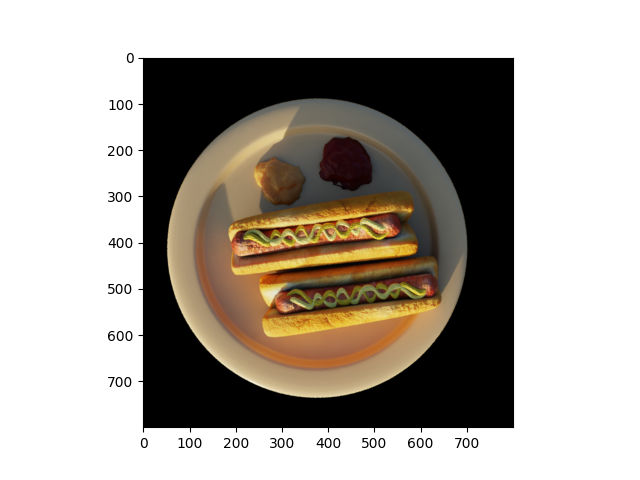

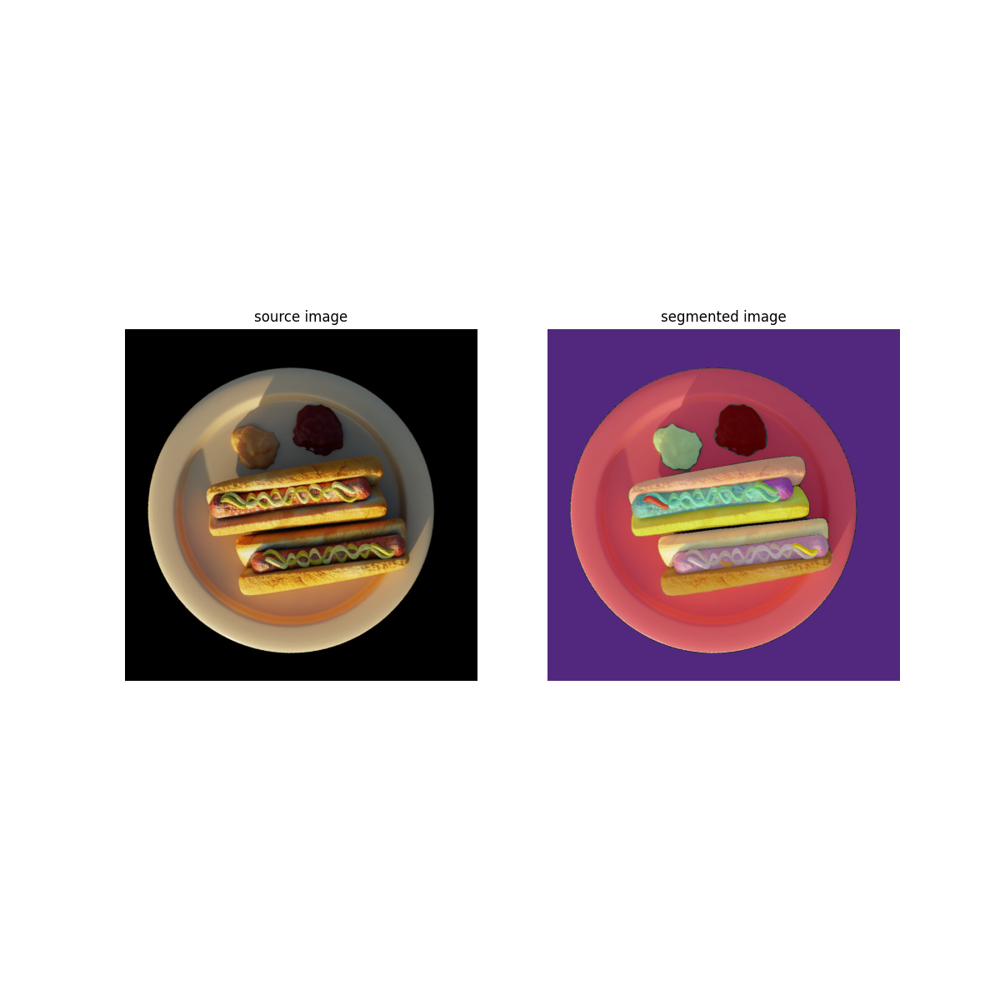

In [151]:

viewpoint_stack = content_scene.getTrainCameras().copy()

viewpoint_cam = viewpoint_stack[13]

bg_color = [1, 1, 1] if dataset.white_background else [0, 0, 0]
background = torch.tensor(bg_color, dtype=torch.float32, device=device)
render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)


image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()



# 3. Apply sam to get masks.  
# transform input into uint8
sam_result = mask_generator.generate(np.clip(image_rgb*255., 0., 255.).astype(np.uint8))
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=False)
]

detections = sv.Detections.from_sam(sam_result=sam_result)
image_bgr = (np.array(image_rgb[...,[2,1,0]])*255.).astype(np.uint8)
annotated_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)
sv.plot_images_grid(
    images=[image_bgr, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

23
4


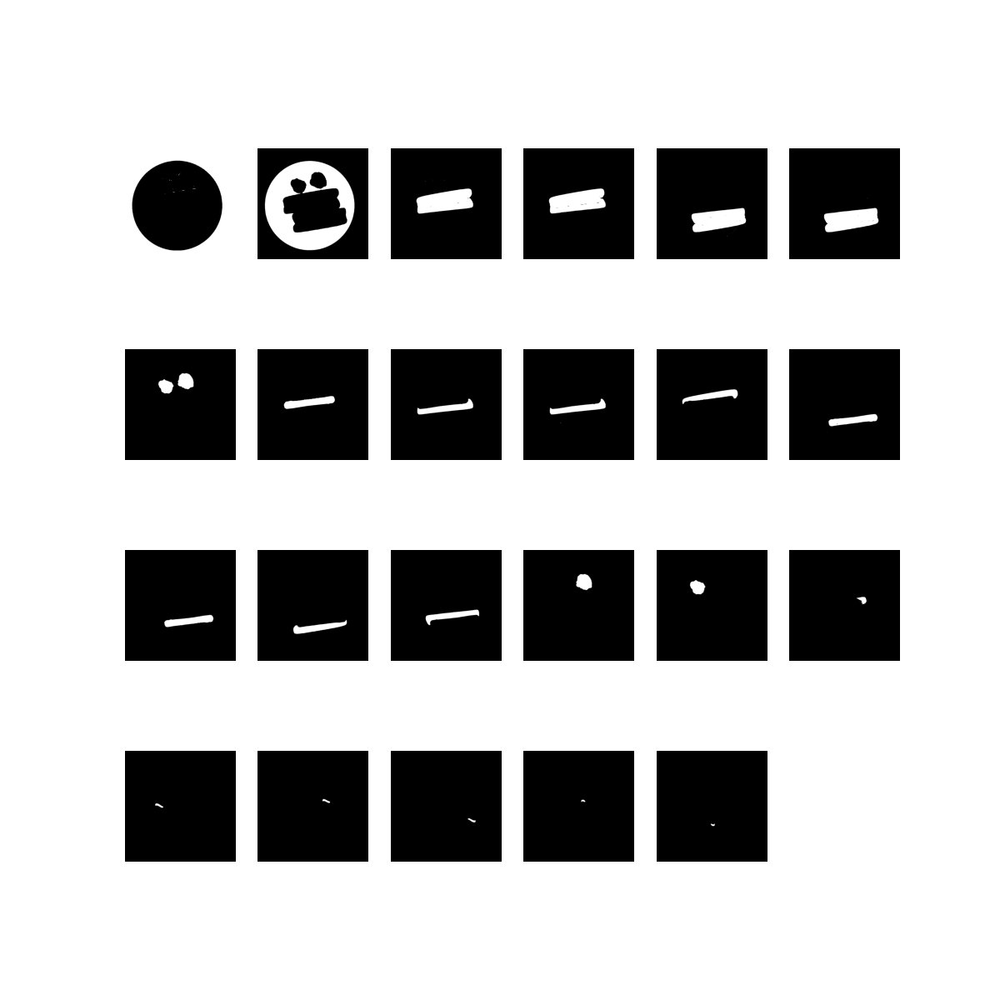

In [152]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=True)
]
print(len(masks))
q = int(np.sqrt(len(masks)))
print(q)
sv.plot_images_grid(
    images=masks,
    grid_size=(q, len(masks)//q+1),
    size=(12, 12)
)

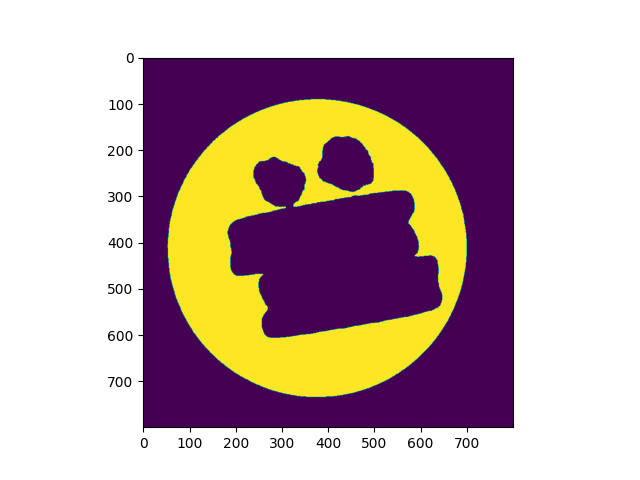

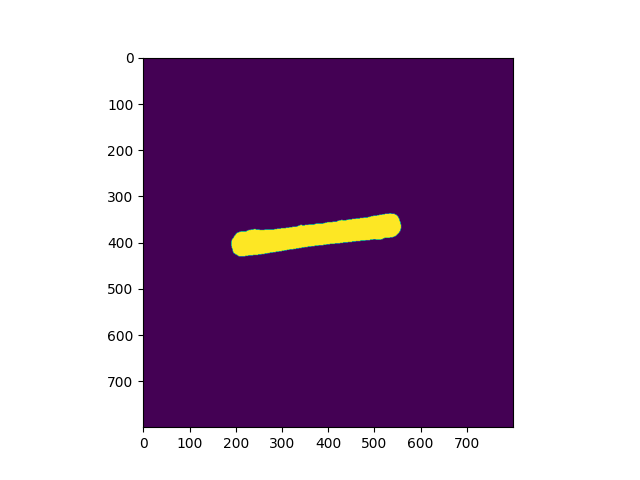

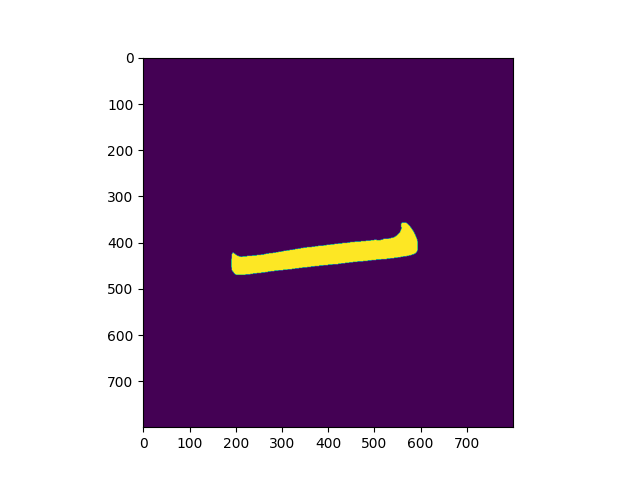

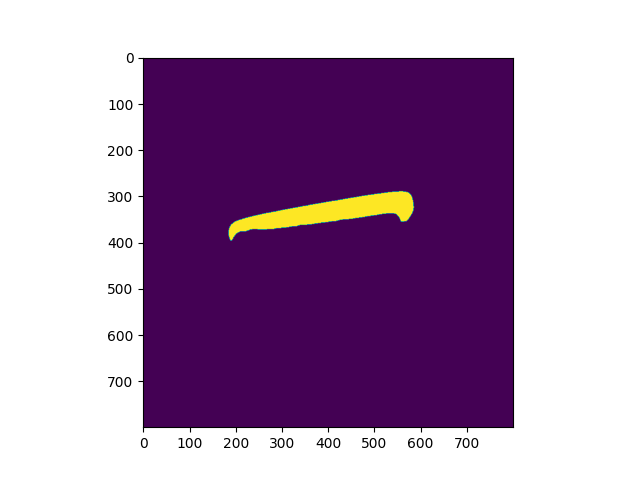

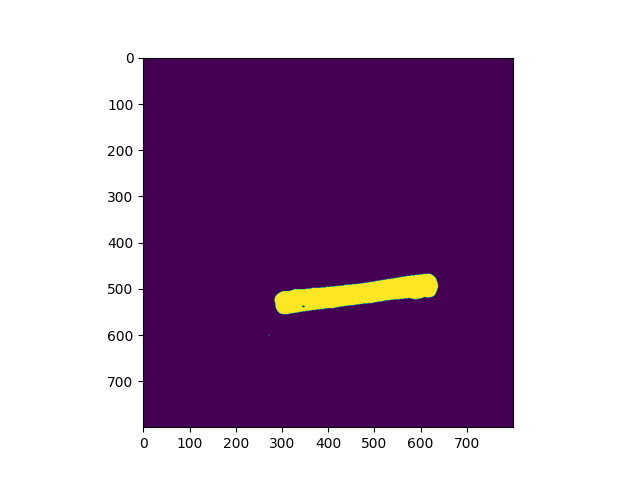

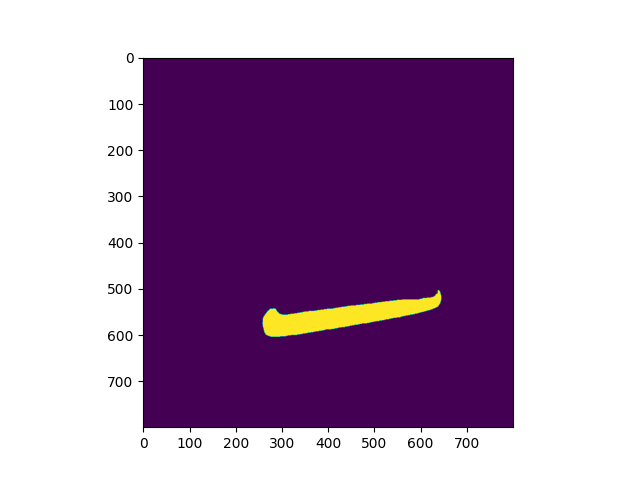

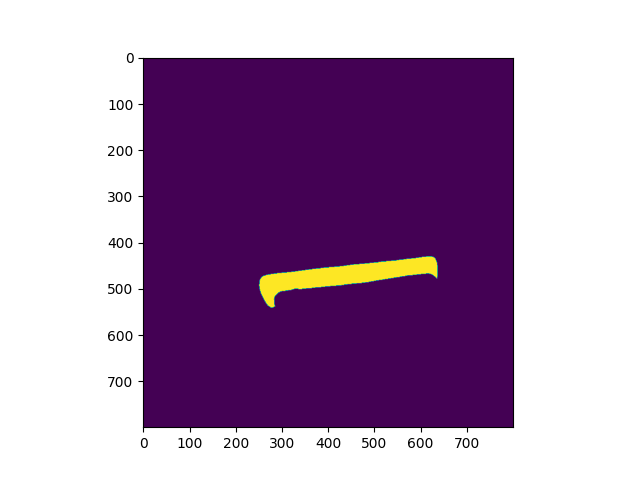

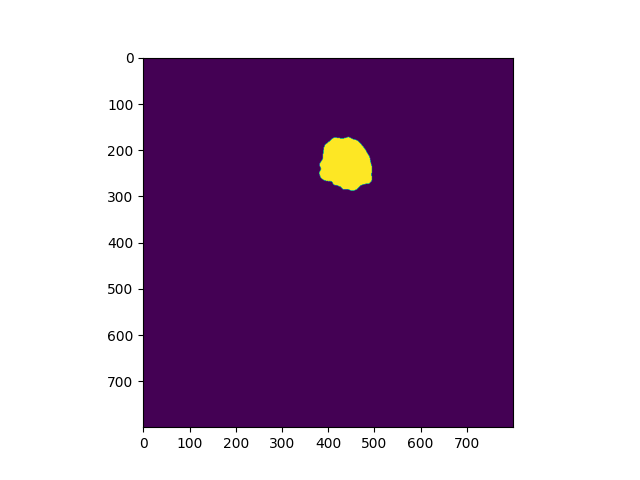

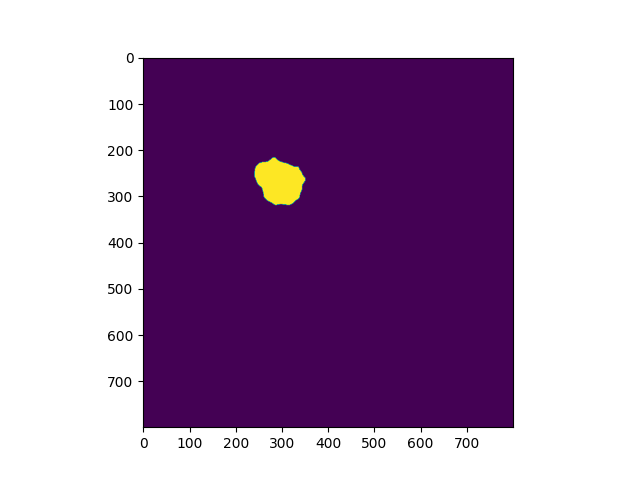

In [153]:
masks_idx = [1,7,8,10,11,13,14,15,16]
for idx in masks_idx:
    plt.figure()
    plt.imshow(masks[idx])
    plt.show()

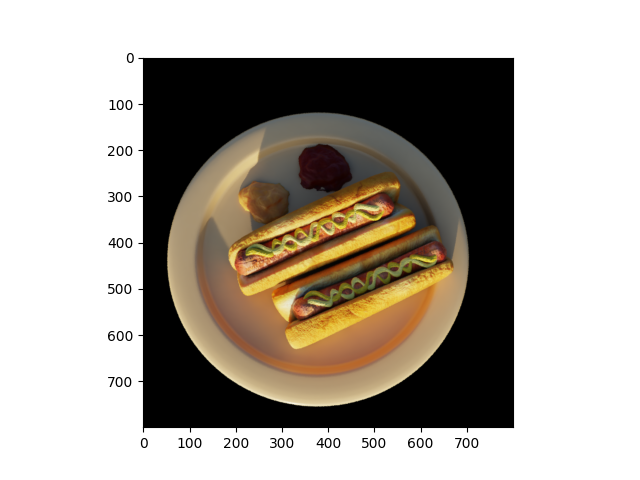

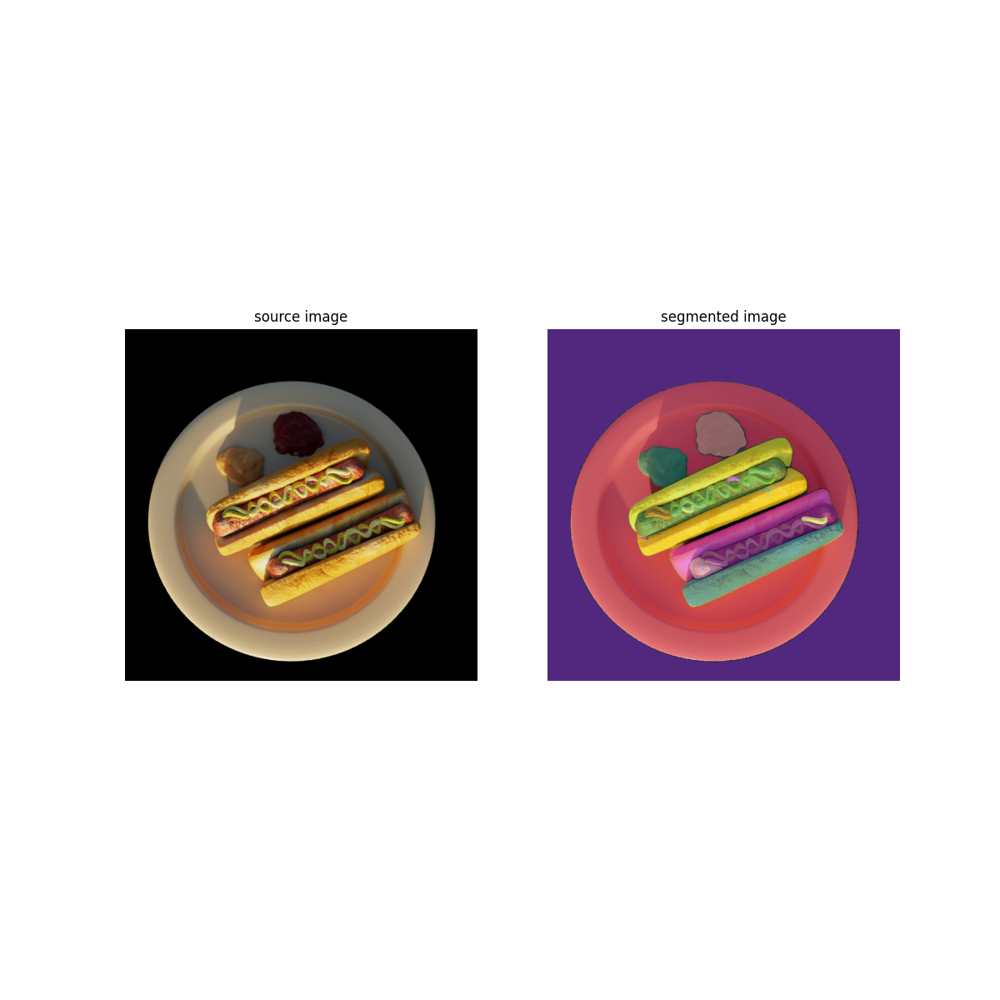

In [154]:

viewpoint_stack = content_scene.getTrainCameras().copy()

viewpoint_cam = viewpoint_stack[30]

bg_color = [1, 1, 1] if dataset.white_background else [0, 0, 0]
background = torch.tensor(bg_color, dtype=torch.float32, device=device)
render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)


image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()



# 3. Apply sam to get masks.  
# transform input into uint8
sam_result = mask_generator.generate(np.clip(image_rgb*255., 0., 255.).astype(np.uint8))
masks2 = [
    mask['segmentation']
    for mask
    in sorted(sam_result, key=lambda x: x['area'], reverse=False)
]

detections = sv.Detections.from_sam(sam_result=sam_result)
image_bgr = (np.array(image_rgb[...,[2,1,0]])*255.).astype(np.uint8)
annotated_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)
sv.plot_images_grid(
    images=[image_bgr, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [117]:
all_fpt.reshape(len(viewpoint_stack), -1).shape

torch.Size([300, 16])

In [146]:
all_fpt = torch.stack([x.full_proj_transform for x in viewpoint_stack], axis=0)
# all_fpt = torch.stack([x.world_view_transform for x in viewpoint_stack], axis=0)
all_fpt_D = torch.cdist(all_fpt.reshape(len(viewpoint_stack), -1), all_fpt.reshape(len(viewpoint_stack), -1))
all_fpt_NNs = torch.topk(all_fpt_D, k=10, dim=1, largest=False, sorted=True)

In [149]:
all_fpt_NNs[0][13], all_fpt_NNs[1][13]

(tensor([0.0000, 0.8543, 1.1958, 1.2013, 1.4372, 1.5051, 1.8581, 1.8864, 2.1445,
         2.2522], device='cuda:0'),
 tensor([13,  9, 31, 30, 67,  7, 85, 74, 98, 86], device='cuda:0'))

In [148]:
all_fpt_NNs[1][13]

tensor([13,  9, 31, 30, 67,  7, 85, 74, 98, 86], device='cuda:0')

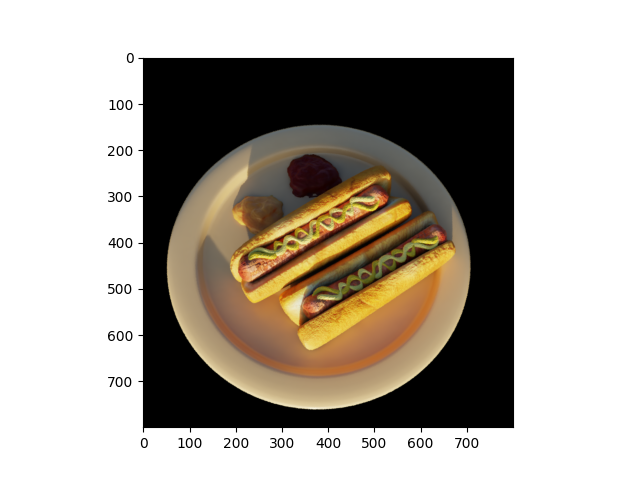

In [145]:

viewpoint_stack = content_scene.getTrainCameras().copy()

viewpoint_cam = viewpoint_stack[85]

bg_color = [1, 1, 1] if dataset.white_background else [0, 0, 0]
background = torch.tensor(bg_color, dtype=torch.float32, device=device)
render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)


image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()

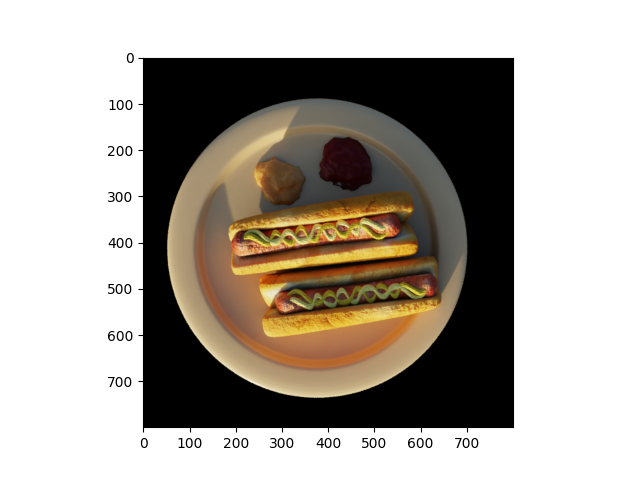

In [125]:

viewpoint_stack = content_scene.getTrainCameras().copy()

viewpoint_cam = viewpoint_stack[13]

bg_color = [1, 1, 1] if dataset.white_background else [0, 0, 0]
background = torch.tensor(bg_color, dtype=torch.float32, device=device)
render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)


image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()

In [ ]:
def find_nearest_cameras(viewpoints_stack):
    cameras = torch.stack([x.full_proj_transform for x in viewpoints_stack

In [155]:

def obtain_surface_pc(viewpoint_stack, gaussians, pipe, background, num_viewpoints=40, pc_size=20000):
    import numpy as np
    import skimage.measure, skimage.morphology
    import scipy

    # 1. Render from different viewpoints and extract points
    all_points = []
    for iter in range(min(num_viewpoints, len(viewpoint_stack))):
        viewpoint_cam = viewpoint_stack.pop(randint(0, len(viewpoint_stack)-1))
        render_pkg_cont = render(viewpoint_cam, gaussians, pipe, background)
        image = render_pkg_cont["render"]
        image_rgb = image.detach().cpu().numpy().transpose(1, 2, 0)
        image_maxpool = skimage.measure.block_reduce(image_rgb, (3,3,1), np.max)
        mask = scipy.ndimage.binary_erosion(np.max(image_maxpool, axis=-1) > 0.1, structure=None, iterations=5)
        image_clean = image_maxpool * np.expand_dims(mask, axis=-1)
        all_points += list(image_clean[np.min(image_clean, axis=-1)>0.1])
    
    
    # 2. Subsample the points 
    all_points = np.array(all_points)
    all_points_idcs = np.random.choice(range(len(all_points)), size=pc_size, replace=False) 
    all_points = all_points[all_points_idcs]

    # 3. Remove poitns that are too far away from all other points.
    # Compute all pairwise distances between points
    from scipy.spatial import distance
    k=10
    pairwise_distances = distance.cdist(all_points, all_points, 'euclidean')
    # Use np.partition to find the k-th smallest distances for each row
    kth_nearest_indices = np.argpartition(pairwise_distances, k, axis=1)[:, :k]
    kth_nearest_distances = np.take_along_axis(pairwise_distances, kth_nearest_indices, axis=1)
    q_outliers = np.quantile(np.max(kth_nearest_distances, axis=-1), 0.99)
    idcs = np.where(np.max(kth_nearest_distances, axis=-1) < q_outliers)[0]
    all_points = all_points[idcs]
    return all_points
        

In [162]:
content_gaussians._opacity.data +=  1e6
content_gaussians_features_ds_original = content_gaussians._features_dc.detach().clone()
content_gaussians._features_dc.data = content_gaussians._xyz.data.clone().detach().unsqueeze(1)
content_gaussians._features_rest.data = content_gaussians._features_rest.data * 0.

content_surface_pc = obtain_surface_pc(viewpoint_stack=viewpoint_stack, 
                               gaussians=content_gaussians, 
                               pipe=pipe, 
                               background=background,
                               num_viewpoints=40)

content_gaussians.restore(torch.load("/home/dimakot55/output_data/gs/GT_hotdog/chkpnt30000.pth")[0], opt)

# Renormalize
# content_surface_pc_orig = np.array(content_surface_pc)
# coords = content_gaussians._xyz.data.detach().cpu().numpy()
# content_surface_pc = (content_surface_pc - np.min(content_surface_pc)) / (np.max(content_surface_pc)  - np.min(content_surface_pc))
# content_surface_pc = content_surface_pc * (np.max(coords)  - np.min(coords)) + np.min(coords)

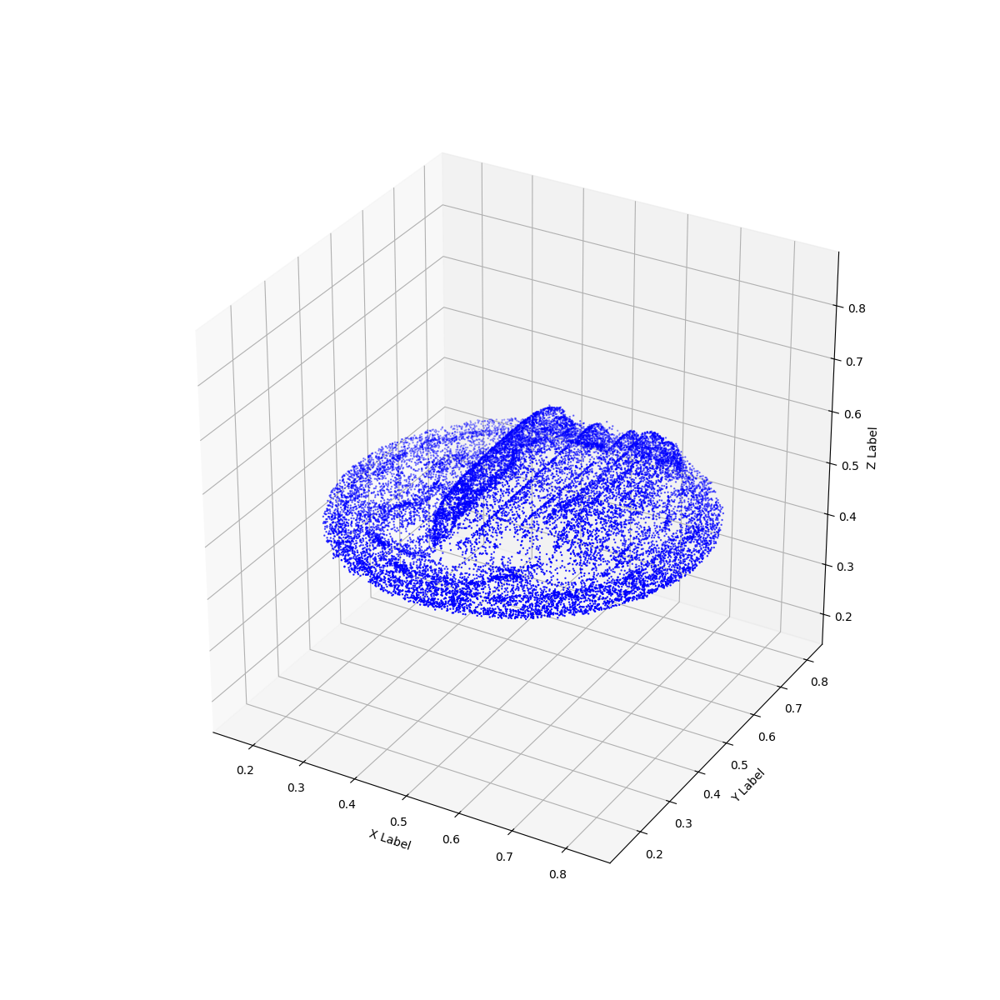

In [163]:

fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111, projection='3d')
#ax.axis('equal')
ax.set_aspect('equal')
# Plot target shape

# Plot the scatter points
kth=1
if True:
    arr = content_surface_pc
    ax.scatter(arr[::kth,0], 
               arr[::kth,1], 
               arr[::kth,2], c='b', marker='o',s=0.5)


# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

ax.set_box_aspect([1,1,1]) # IMPORTANT - this is the new, key line
# ax.set_proj_type('ortho') # OPTIONAL - default is perspective (shown in image above)
set_axes_equal(ax) # IMPORTANT - this is also required
plt.show()


In [ ]:
viewpoint_stack = content_scene.getTrainCameras().copy()
results = {}
for viewpoint_cam_idx in tqdm(range(len(viewpoint_stack))):

    
    viewpoint_cam = viewpoint_stack[viewpoint_cam_idx]
    
    bg_color = [1, 1, 1] if dataset.white_background else [0, 0, 0]
    background = torch.tensor(bg_color, dtype=torch.float32, device=device)
    render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
    image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]
    image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
    
    
    image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
    #plt.figure()
    #plt.imshow(image_rgb)
    #plt.show()
    
    
    
    # 3. Apply sam to get masks.  
    # transform input into uint8
    sam_result = mask_generator.generate(np.clip(image_rgb*255., 0., 255.).astype(np.uint8))
    masks = [
        mask['segmentation']
        for mask
        in sorted(sam_result, key=lambda x: x['area'], reverse=False)
    ]
    
    detections = sv.Detections.from_sam(sam_result=sam_result)
    image_bgr = (np.array(image_rgb[...,[2,1,0]])*255.).astype(np.uint8)
    annotated_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)

    results[viewpoint_cam_idx] = {"viewpoint_cam" : viewpoint_cam,
                                  "image_rgb" : image_rgb,
                                  "image_bgr" : image_bgr,
                                  "masks" : masks,
                                  "detections" : detections,
                                  "annotated_image" : annotated_image}
                                  
                            

/tmp/ipykernel_732622/517152955.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for viewpoint_cam_idx in tqdm(range(len(viewpoint_stack))):


  0%|          | 0/300 [00:00<?, ?it/s]

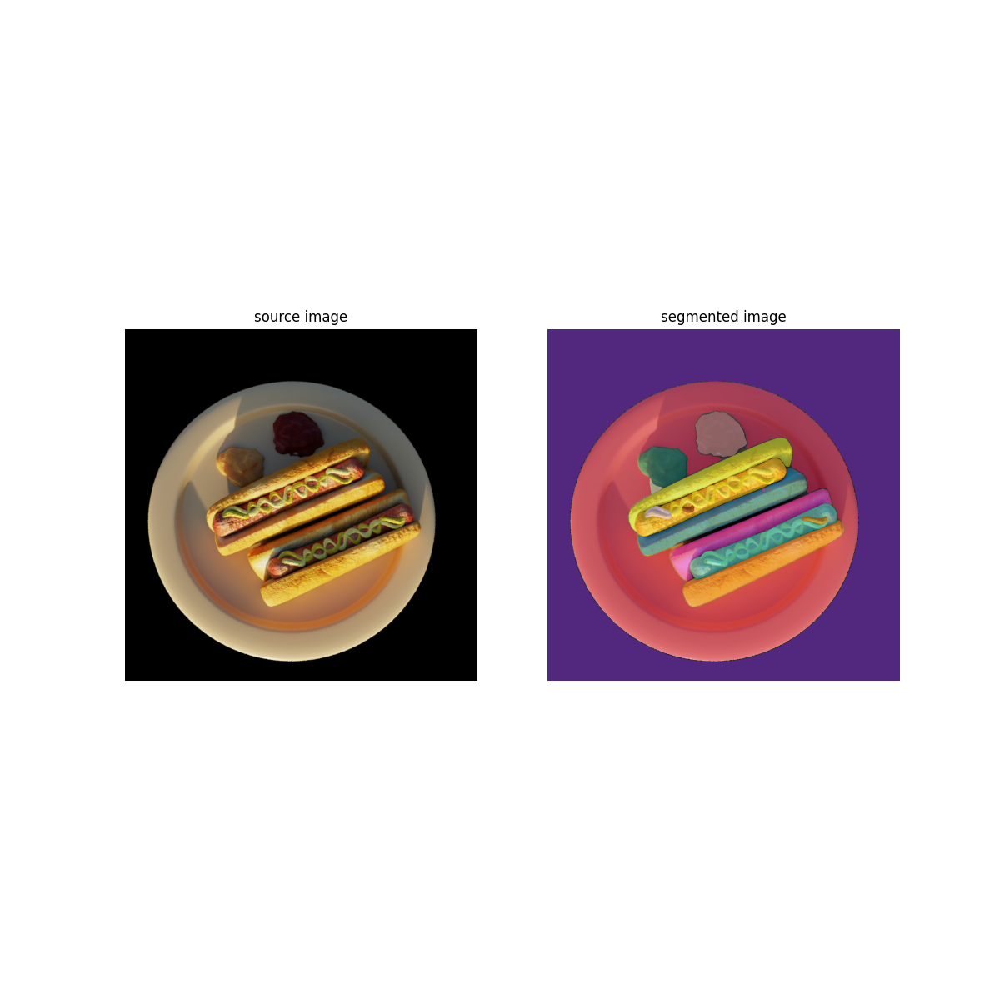

In [169]:
results
sv.plot_images_grid(
    images=[results[114]["image_bgr"], results[114]["annotated_image"]],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)